In [1]:
# --- Shared helpers: prefer local USB webcam capture and TRT if available
import os
import numpy as np
import cv2
from camera_utils import capture_image

# Try to import TensorRT wrapper (only used on Jetson with an engine present)
trt_infer = None
try:
    import tensorrt as _trt  # type: ignore
    from trt_inference import TRTInfer  # type: ignore
    if os.path.exists('model.trt'):
        try:
            trt_infer = TRTInfer('model.trt', input_shape=(128, 128, 3))
        except Exception as _e:
            trt_infer = None
except (ImportError, ModuleNotFoundError):
    # TensorRT not available in this environment
    trt_infer = None
except Exception:
    trt_infer = None

# Keras fallback (load only if needed)
feature_extractor = None
try:
    import tensorflow as tf
    if feature_extractor is None and os.path.exists('face_embedding_model_CLEAN.h5'):
        try:
            feature_extractor = tf.keras.models.load_model('face_embedding_model_CLEAN.h5', compile=False)
        except Exception:
            feature_extractor = None
except Exception:
    pass


def get_embedding_from_image_shared(img):
    """Preprocess image (BGR->RGB, resize, normalize) and run through available model."""
    if img is None:
        return None
    # convert BGR->RGB if necessary
    if img.ndim == 3 and img.shape[2] == 3:
        img_rgb = img[:, :, ::-1]
    else:
        img_rgb = img
    pre = cv2.resize(img_rgb, (128, 128), interpolation=cv2.INTER_LINEAR).astype('float32') / 255.0
    if trt_infer is not None:
        return trt_infer.predict(pre)
    if feature_extractor is not None:
        inp = np.expand_dims(pre, axis=0)
        emb = feature_extractor.predict(inp, verbose=0)[0]
        return emb
    raise RuntimeError('No model available for inference (install/load TRT engine or Keras .h5)')

# Alias names used across the notebook - import once to centralize behavior
get_embedding_from_image = get_embedding_from_image_shared
# capture_image is provided by camera_utils and already imported above

/Users/soumikadas/Documents/SourceCodes/InnovativeProject/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
import numpy as np
import os
import random
import glob
import cv2
from sklearn.model_selection import train_test_split
from zipfile import ZipFile

# --- CONFIGURATION ---
IMG_SIZE = 128
EMBEDDING_DIM = 64
MARGIN = 1.0 # Margin for Contrastive Loss
EPOCHS = 20
BATCH_SIZE = 32

# NOTE: Adjust these paths to match your uploaded zip file names
REFERENCE_ZIP_NAME = "short_references_final.zip" # Assuming 'difference' is your reference/clean set
DISTORTION_ZIP_NAME ="Short_distortion_final.zip"
OUTPUT_DIR = './data_extracted'

# Create output directory if it doesn't exist
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

print("Starting file extraction...")

# Unzip Reference/Clean Images
try:
    with ZipFile(REFERENCE_ZIP_NAME, 'r') as zip_ref:
        zip_ref.extractall(OUTPUT_DIR + '/ref')
    print(f"✅ Successfully extracted {REFERENCE_ZIP_NAME} to {OUTPUT_DIR}/ref")
except FileNotFoundError:
    print(f"⚠️ ERROR: {REFERENCE_ZIP_NAME} not found. Please upload it to your Colab environment.")

# Unzip Distorted Images
try:
    with ZipFile(DISTORTION_ZIP_NAME, 'r') as zip_ref:
        zip_ref.extractall(OUTPUT_DIR + '/distorted')
    print(f"✅ Successfully extracted {DISTORTION_ZIP_NAME} to {OUTPUT_DIR}/distorted")
except FileNotFoundError:
    print(f"⚠️ ERROR: {DISTORTION_ZIP_NAME} not found. Please upload it to your Colab environment.")

Starting file extraction...
✅ Successfully extracted short_references_final.zip to ./data_extracted/ref
✅ Successfully extracted Short_distortion_final.zip to ./data_extracted/distorted
✅ Successfully extracted Short_distortion_final.zip to ./data_extracted/distorted


In [3]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import os
import random
import glob
import cv2
import hashlib
import io
import base64
from PIL import Image as PILImage
from IPython.display import display, Javascript, Image as IPImage

# Check if running in Colab
try:
    from google.colab.output import eval_js
    IN_COLAB = True
except ImportError:
    IN_COLAB = False
    print("Not running in Colab - some features may be limited")

# --- 1. CONFIGURATION AND CONSTANTS ---
IMG_SIZE = 128
EMBEDDING_DIM = 64
MARGIN = 1.0
EPOCHS = 10
STEPS_PER_EPOCH = 32
BATCH_SIZE = 32
VERIFICATION_THRESHOLD = 0.6
MODEL_FILE_CLEAN = "face_embedding_model_CLEAN.h5"

OUTPUT_DIR = './data_extracted'
NEW_BASE_DIR = './data_refined'
CLEAN_REF_DIR = os.path.join(NEW_BASE_DIR, 'CLEAN_REF')
DISTORTED_IMG_DIR = os.path.join(NEW_BASE_DIR, 'DISTORTED_IMG')

# --- 2. CORE HELPER FUNCTIONS ---

def person_id_from_filename(filename):
    """Handles both 'ID.jpg' and 'ID__distortion.jpg' patterns."""
    base_name = os.path.basename(filename)
    if '__' in base_name:
        return base_name.split('__')[0]
    elif '.' in base_name:
        return base_name.split('.')[0]
    return "UNKNOWN"


def get_file_hash(filepath):
    """Calculates SHA256 hash of a file for duplicate detection."""
    hasher = hashlib.sha256()
    with open(filepath, 'rb') as file:
        while True:
            chunk = file.read(4096)
            if not chunk: break
            hasher.update(chunk)
    return hasher.hexdigest()


def load_and_preprocess_image(path):
    """Loads, resizes, and normalizes a single image from path."""
    img = cv2.imread(path)
    if img is None: return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img.astype('float32') / 255.0
    return img

# --- 3. MODEL ARCHITECTURE AND LOSS ---

def build_feature_extractor(input_shape):
    input_tensor = keras.Input(shape=input_shape)
    x = layers.Conv2D(32, (3, 3), activation="relu")(input_tensor)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Conv2D(64, (3, 3), activation="relu")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Conv2D(128, (3, 3), activation="relu")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Flatten()(x)
    x = layers.Dense(128, activation="relu")(x)
    output_embedding = layers.Dense(EMBEDDING_DIM)(x)
    return keras.Model(input_tensor, output_embedding, name="feature_extractor")

def build_siamese_model(input_shape):
    feature_extractor = build_feature_extractor(input_shape)
    input_A = keras.Input(shape=input_shape, name="input_ref")
    input_B = keras.Input(shape=input_shape, name="input_distorted")
    embedding_A = feature_extractor(input_A)
    embedding_B = feature_extractor(input_B)
    squared_distance = layers.Lambda(
        lambda x: tf.reduce_sum(tf.square(x[0] - x[1]), axis=-1, keepdims=True)
    )([embedding_A, embedding_B])
    distance = layers.Lambda(lambda x: tf.sqrt(tf.maximum(x, 1e-6)), name="euclidean_distance")(squared_distance)
    return keras.Model(inputs=[input_A, input_B], outputs=distance, name="Siamese_Verification_Model")

def contrastive_loss(y_true, y_pred, margin=MARGIN):
    square_pred = tf.square(y_pred)
    margin_square = tf.square(tf.maximum(margin - y_pred, 0))
    loss = tf.cast(y_true, tf.float32) * square_pred + (1 - tf.cast(y_true, tf.float32)) * margin_square
    return tf.reduce_mean(loss)

def siamese_pair_generator(image_paths_by_person, person_ids, batch_size):
    while True:
        ref_images = []
        dist_images = []
        labels = []
        for _ in range(batch_size):
            person_id = random.choice(person_ids)
            paths = image_paths_by_person.get(person_id, [])
            if len(paths) < 2: continue

            # 50% Positive, 50% Negative
            if random.random() < 0.5:
                # Positive Pair (Same Person)
                img_path1, img_path2 = random.sample(paths, 2)
                label = 1.0
            else:
                # Negative Pair (Different People)
                p1_id, p2_id = random.sample(person_ids, 2)
                img_path1 = random.choice(image_paths_by_person.get(p1_id, []))
                img_path2 = random.choice(image_paths_by_person.get(p2_id, []))
                label = 0.0

            img1 = load_and_preprocess_image(img_path1)
            img2 = load_and_preprocess_image(img_path2)

            if img1 is not None and img2 is not None:
                ref_images.append(img1)
                dist_images.append(img2)
                labels.append(label)

        if ref_images:
            yield ((np.array(ref_images), np.array(dist_images)), np.array(labels))

# --- 4. REAL-TIME VERIFICATION LOGIC ---

def get_embedding_from_image(img_array, feature_extractor_model):
    """Get embedding from a preprocessed image array."""
    img_batch = np.expand_dims(img_array, axis=0)
    embedding = feature_extractor_model.predict(img_batch, verbose=0)
    return embedding[0]

def identify_face_from_frame(face_array, feature_extractor_model, gallery, threshold):
    """Preprocesses a cropped face array and identifies the person."""
    # Use IMG_SIZE to ensure consistency
    processed_face = cv2.resize(face_array, (IMG_SIZE, IMG_SIZE))
    processed_face = processed_face.astype('float32') / 255.0
    # Use centralized helper
    query_emb = get_embedding_from_image(processed_face, feature_extractor_model)

    min_distance = float('inf')
    best_match_id = "UNKNOWN"

    for person_id, emb in gallery.items():
        distance = np.linalg.norm(query_emb - emb)
        if distance < min_distance:
            min_distance = distance
            best_match_id = person_id
    
    if min_distance <= threshold:
        return best_match_id, min_distance
    else:
        return "UNKNOWN", min_distance

def get_webcam_frame_colab(quality=0.8):
    """Captures a single frame from the browser's webcam."""
    if not IN_COLAB:
        print("Warning: get_webcam_frame_colab() only works in Google Colab")
        return None
    
    js = Javascript('''
        async function capture() {
            const div = document.createElement('div');
            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});
            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);
            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);
            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL('image/jpeg', %s);
        }
        ''' % quality)

    data = eval_js(js.data)
    binary = base64.b64decode(data.split(',')[1])
    img = PILImage.open(io.BytesIO(binary))
    frame = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    return frame

def detect_and_crop_face(frame):
    """Uses Haar Cascade to reliably find and crop the largest face."""
    FACE_CASCADE = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = FACE_CASCADE.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    if len(faces) == 0:
        return None, None

    (x, y, w, h) = max(faces, key=lambda rect: rect[2] * rect[3])
    cropped_face = frame[y:y+h, x:x+w]
    return cropped_face, (x, y, w, h)

# ---------------------------------------------------------------------
# Ensure Haar Cascade is downloaded for later use
if IN_COLAB:
    import subprocess
    subprocess.run(['wget', '-nc', 'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml'])
else:
    # For local environment, download using requests
    import urllib.request
    cascade_file = 'haarcascade_frontalface_default.xml'
    if not os.path.exists(cascade_file):
        print("Downloading Haar Cascade file...")
        urllib.request.urlretrieve(
            'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml',
            cascade_file
        )

# NOTE: Assuming your original zip file contents are available in OUTPUT_DIR

# (Simplified data indexing for demonstration (assuming clean, unique files))
reference_images_by_person = {}
distorted_images_by_person = {}

for root, _, files in os.walk(OUTPUT_DIR):
    for f in files:
        path = os.path.join(root, f)
        person_id = person_id_from_filename(f)
        if 'reference' in root.lower() or 'ref' in root.lower():
            reference_images_by_person.setdefault(person_id, []).append(path)
        elif 'distorted' in root.lower():
            distorted_images_by_person.setdefault(person_id, []).append(path)

# Merge all images for training
merged_image_paths = {}
PERSON_IDS = list(set(list(reference_images_by_person.keys()) + list(distorted_images_by_person.keys())))

for person_id in PERSON_IDS:
    merged_image_paths[person_id] = reference_images_by_person.get(person_id, []) + distorted_images_by_person.get(person_id, [])

# --- Part 2: TRAIN OR LOAD MODEL ---
input_shape = (IMG_SIZE, IMG_SIZE, 3)

if os.path.exists(MODEL_FILE_CLEAN):
    print(f"Loading existing model from {MODEL_FILE_CLEAN}...")
    siamese_model = keras.models.load_model(MODEL_FILE_CLEAN, custom_objects={'contrastive_loss': contrastive_loss})
    feature_extractor = siamese_model.get_layer('feature_extractor')
    print("✅ Model loaded successfully.")
    print("✅ Saved Model Size (MB):", os.path.getsize(MODEL_FILE_CLEAN) / 1024 / 1024)
    
    # Download model file if in Colab
    if IN_COLAB:
        from google.colab import files
        files.download(MODEL_FILE_CLEAN)
else:
    print("No existing model found. Please train the model first.")
    feature_extractor = None

# --- Part 3: BUILD GALLERY ---
gallery_embeddings = {}
print("\n--- Building Final Gallery Embeddings ---")

if feature_extractor is not None:
    for person_id in PERSON_IDS:
        ref_paths = reference_images_by_person.get(person_id)
        if not ref_paths: 
            continue
    
        ref_path = ref_paths[0]
        ref_img = load_and_preprocess_image(ref_path)
        
        if ref_img is None:
            continue
    
        # Use centralized inference helper
        ref_emb = get_embedding_from_image(ref_img, feature_extractor)
        gallery_embeddings[person_id] = ref_emb
    
    print(f"✅ Gallery created for {len(gallery_embeddings)} people.")
else:
    print("⚠️ Cannot build gallery - feature extractor not loaded.")


Not running in Colab - some features may be limited
No existing model found. Please train the model first.

--- Building Final Gallery Embeddings ---
⚠️ Cannot build gallery - feature extractor not loaded.


## Train the Siamese Network

This cell will:
1. **Build** the Siamese neural network for face verification
2. **Train** it on your dataset using contrastive loss
3. **Save** the trained model as `face_embedding_model_CLEAN.h5`
4. **Build** the gallery embeddings for all reference faces

**Note:** Training may take 5-10 minutes depending on your hardware. The model learns to distinguish between same-person pairs (similar embeddings) and different-person pairs (dissimilar embeddings).


Starting Model Training

Dataset Statistics:
  Total unique persons: 50
  Reference images: 50
  Distorted images: 250
  Merged images for training: 300

✅ Dataset is ready for training with 50 people

--- Building Siamese Model ---
✅ Model compiled successfully

Model will be trained for 10 epochs with 32 steps per epoch

--- Starting Training ---
This may take several minutes depending on your hardware...

Epoch 1/10
Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 24s 688ms/step - accuracy: 0.4662 - loss: 15.4829
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 24s 688ms/step - accuracy: 0.4662 - loss: 15.4829
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 627ms/step - accuracy: 0.3777 - loss: 0.3865
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 627ms/step - accuracy: 0.3777 - loss: 0.3865
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 629ms/step - accuracy: 0.3588 - loss: 0.3351
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 629ms/step - accuracy: 0.3588 - loss: 0.3351
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 21s 666ms/step 


✅ Training completed!

--- Saving Model to face_embedding_model_CLEAN.h5 ---
✅ Model saved successfully!
   File: face_embedding_model_CLEAN.h5
   Size: 12.68 MB


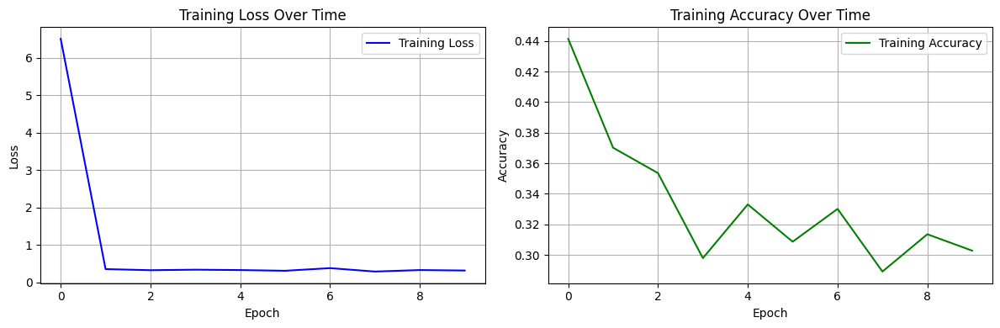


--- Building Gallery Embeddings with Trained Model ---
✅ Gallery created for 50 people

Training Complete! You can now use the model for verification.
✅ Gallery created for 50 people

Training Complete! You can now use the model for verification.


In [5]:
# --- TRAIN THE SIAMESE MODEL ---
print("=" * 60)
print("Starting Model Training")
print("=" * 60)

# Check if we have enough data
print(f"\nDataset Statistics:")
print(f"  Total unique persons: {len(PERSON_IDS)}")
print(f"  Reference images: {sum(len(v) for v in reference_images_by_person.values())}")
print(f"  Distorted images: {sum(len(v) for v in distorted_images_by_person.values())}")
print(f"  Merged images for training: {sum(len(v) for v in merged_image_paths.values())}")

# Verify we have enough data
if len(PERSON_IDS) < 2:
    print("\n⚠️ ERROR: Need at least 2 different people for training!")
    print("Please ensure your data_extracted folder has images from multiple people.")
else:
    print(f"\n✅ Dataset is ready for training with {len(PERSON_IDS)} people")
    
    # Build the Siamese model
    print("\n--- Building Siamese Model ---")
    input_shape = (IMG_SIZE, IMG_SIZE, 3)
    siamese_model = build_siamese_model(input_shape)
    
    # Compile the model
    siamese_model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.0001),
        loss=contrastive_loss,
        metrics=['accuracy']
    )
    
    print("✅ Model compiled successfully")
    print(f"\nModel will be trained for {EPOCHS} epochs with {STEPS_PER_EPOCH} steps per epoch")
    
    # Create data generator
    train_generator = siamese_pair_generator(
        merged_image_paths,
        PERSON_IDS,
        BATCH_SIZE
    )
    
    # Train the model
    print("\n--- Starting Training ---")
    print("This may take several minutes depending on your hardware...\n")
    
    history = siamese_model.fit(
        train_generator,
        steps_per_epoch=STEPS_PER_EPOCH,
        epochs=EPOCHS,
        verbose=1
    )
    
    print("\n✅ Training completed!")
    
    # Save the model
    print(f"\n--- Saving Model to {MODEL_FILE_CLEAN} ---")
    siamese_model.save(MODEL_FILE_CLEAN, include_optimizer=False)
    
    # Extract feature extractor for inference
    feature_extractor = siamese_model.get_layer('feature_extractor')
    
    # Display model info
    import os
    model_size_mb = os.path.getsize(MODEL_FILE_CLEAN) / 1024 / 1024
    print(f"✅ Model saved successfully!")
    print(f"   File: {MODEL_FILE_CLEAN}")
    print(f"   Size: {model_size_mb:.2f} MB")
    
    # Plot training history if available
    if history and hasattr(history, 'history'):
        import matplotlib.pyplot as plt
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        
        # Plot loss
        ax1.plot(history.history['loss'], 'b-', label='Training Loss')
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Loss')
        ax1.set_title('Training Loss Over Time')
        ax1.legend()
        ax1.grid(True)
        
        # Plot accuracy
        if 'accuracy' in history.history:
            ax2.plot(history.history['accuracy'], 'g-', label='Training Accuracy')
            ax2.set_xlabel('Epoch')
            ax2.set_ylabel('Accuracy')
            ax2.set_title('Training Accuracy Over Time')
            ax2.legend()
            ax2.grid(True)
        
        plt.tight_layout()
        plt.show()
    
    # Rebuild gallery with trained model
    print("\n--- Building Gallery Embeddings with Trained Model ---")
    gallery_embeddings = {}
    
    for person_id in PERSON_IDS:
        ref_paths = reference_images_by_person.get(person_id)
        if not ref_paths:
            continue
        
        ref_path = ref_paths[0]
        ref_img = load_and_preprocess_image(ref_path)
        
        if ref_img is None:
            continue
        
        # Get embedding
        ref_emb = get_embedding_from_image(ref_img, feature_extractor)
        gallery_embeddings[person_id] = ref_emb
    
    print(f"✅ Gallery created for {len(gallery_embeddings)} people")
    print("\n" + "=" * 60)
    print("Training Complete! You can now use the model for verification.")
    print("=" * 60)


In [9]:
# --- Verify Model File ---
# This cell checks if the model file exists and displays its information

import os

if os.path.exists(MODEL_FILE_CLEAN):
    model_size_mb = os.path.getsize(MODEL_FILE_CLEAN) / 1024 / 1024
    print(f"✅ Model file exists: {MODEL_FILE_CLEAN}")
    print(f"   Size: {model_size_mb:.2f} MB")
    print(f"\n📊 Model Information:")
    print(f"   - Feature extractor is loaded: {feature_extractor is not None}")
    print(f"   - Gallery size: {len(gallery_embeddings)} people")
    
    # Download model file if in Colab
    if IN_COLAB:
        print("\n📥 Downloading model file...")
        from google.colab import files
        files.download(MODEL_FILE_CLEAN)
else:
    print(f"⚠️ Model file not found: {MODEL_FILE_CLEAN}")
    print("Please run the training cell first.")


✅ Model file exists: face_embedding_model_CLEAN.h5
   Size: 12.68 MB

📊 Model Information:
   - Feature extractor is loaded: True
   - Gallery size: 50 people


In [12]:
# Display the Siamese Model Architecture
if 'siamese_model' in locals() or 'siamese_model' in globals():
    print("🏗️ Siamese Model Architecture:\n")
    siamese_model.summary()
else:
    print("⚠️ Siamese model not found. Please run the training cell first.")


🏗️ Siamese Model Architecture:



Model: "Siamese_Verification_Model"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_ref           │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_distorted     │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ feature_extractor   │ (None, 64)        │  3,313,792 │ input_ref[0][0],  │
│ (Functional)        │                   │            │ input_distorted[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 1)         │          0 │ feature_extracto… │
│                     │                   │            │ feature_extracto… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ euclidean_distance  │ (None, 1)         │          0 │ lambda[0][0]      │
│ (Lambda)            │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 9,940,482 (37.92 MB)

 Trainable params: 3,313,344 (12.64 MB)

 Non-trainable params: 448 (1.75 KB)

 Optimizer params: 6,626,690 (25.28 MB)

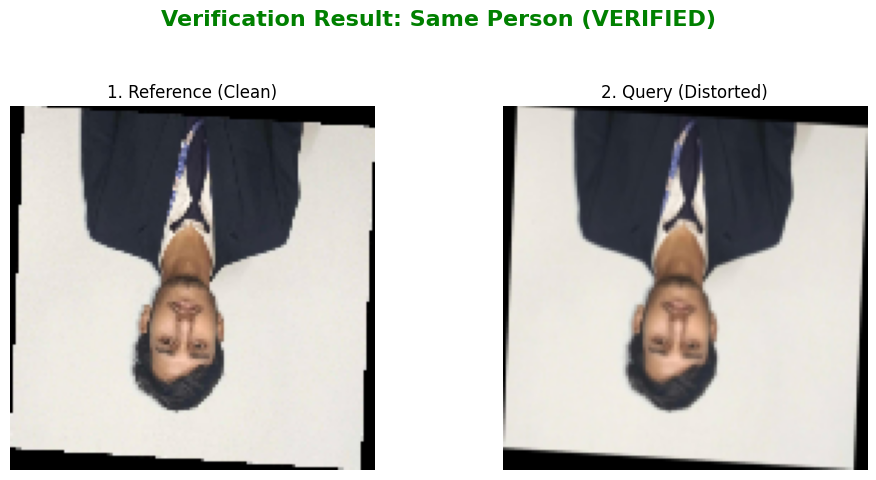


--- CONSOLE OUTPUT ---
Randomly selected ID: YSP-9
Calculated Distance: 0.0000
Final Verdict: Same Person (VERIFIED)


In [13]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: feature_extractor, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img, feature_extractor)
    emb_query = get_embedding_from_image(query_img, feature_extractor)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # Check for all-black image data
    if np.all(ref_img == 0):
      print("WARNING: Reference image array is all zeros. Check load_and_preprocess_image for file loading error.")

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


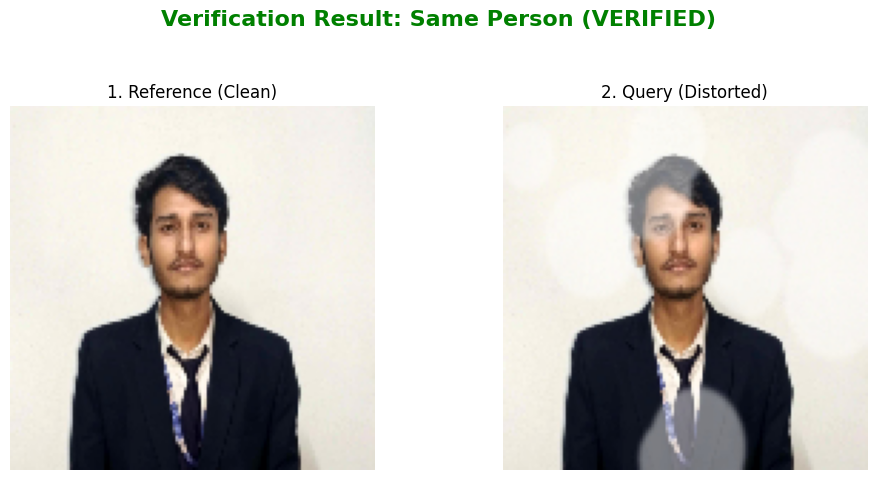


--- CONSOLE OUTPUT ---
Randomly selected ID: YSP-8
Calculated Distance: 0.1262
Final Verdict: Same Person (VERIFIED)


In [15]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: feature_extractor, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img, feature_extractor)
    emb_query = get_embedding_from_image(query_img, feature_extractor)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


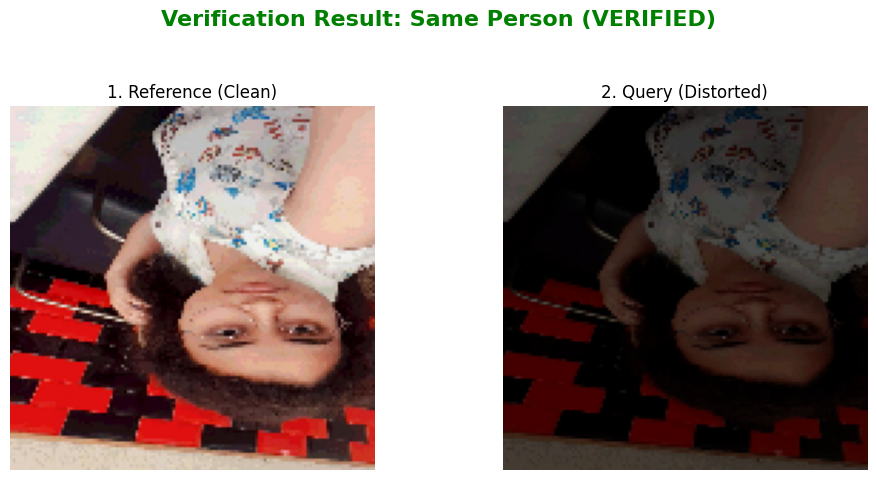


--- CONSOLE OUTPUT ---
Randomly selected ID: SMD-7
Calculated Distance: 0.0000
Final Verdict: Same Person (VERIFIED)


In [19]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: feature_extractor, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img, feature_extractor)
    emb_query = get_embedding_from_image(query_img, feature_extractor)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


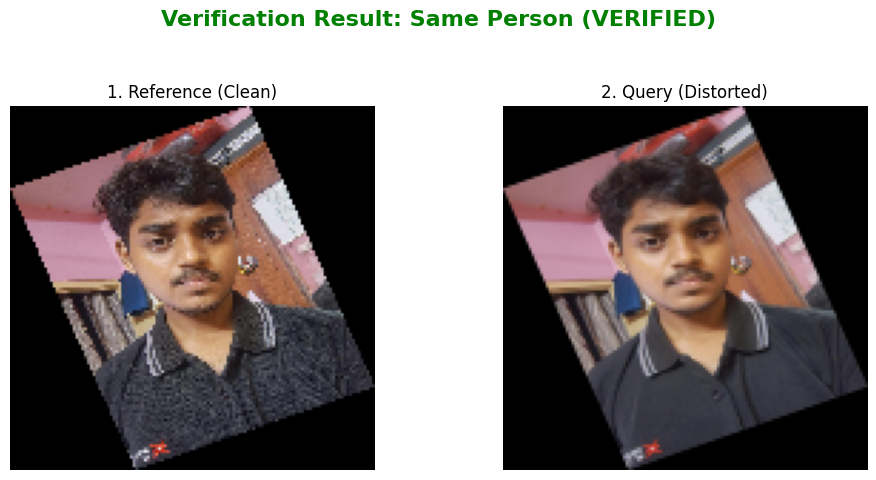


--- CONSOLE OUTPUT ---
Randomly selected ID: MND-6
Calculated Distance: 0.0178
Final Verdict: Same Person (VERIFIED)


In [24]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image_shared(ref_img)
    emb_query = get_embedding_from_image_shared(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


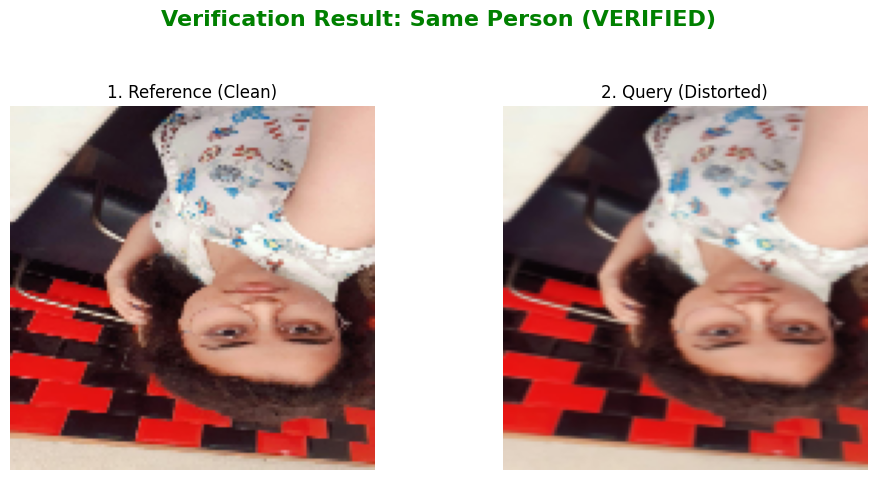


--- CONSOLE OUTPUT ---
Randomly selected ID: SMD-8
Calculated Distance: 0.0232
Final Verdict: Same Person (VERIFIED)


In [26]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image_shared(ref_img)
    emb_query = get_embedding_from_image_shared(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


In [33]:
import cv2
import numpy as np
from IPython.display import display, Javascript, Image
import base64
import io
from PIL import Image as PILImage

# Try to import Colab modules if available
try:
    from google.colab.output import eval_js
    IN_COLAB_WEBCAM = True
except ImportError:
    IN_COLAB_WEBCAM = False
    print("⚠️ Google Colab modules not available. Using local webcam support.")

# --- JAVASCRIPT/COLAB CAMERA ACCESS CODE ---

def get_webcam_frame_colab(quality=0.8):
    """
    Captures a single frame from the browser's webcam and returns it as an OpenCV BGR NumPy array.
    Only works in Google Colab environment.
    """
    if not IN_COLAB_WEBCAM:
        print("❌ This function only works in Google Colab environment.")
        print("For local webcam access, use get_webcam_frame_local() instead.")
        return None
    
    js = Javascript('''
        async function capture() {
            // Setup elements
            const div = document.createElement('div');
            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;

            // Wait for video to load
            await new Promise((resolve) => video.onplaying = resolve);

            // Capture the frame
            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);

            // Stop the stream and remove elements
            stream.getVideoTracks()[0].stop();
            document.body.removeChild(div);

            return canvas.toDataURL('image/jpeg', %s);
        }
        capture();
    ''' % quality)

    # Execute JavaScript and get image data
    data = eval_js(js.data)

    # Decode image data from base64 to OpenCV format
    binary = base64.b64decode(data.split(',')[1])
    img = PILImage.open(io.BytesIO(binary))

    # Convert PIL Image (RGB) to OpenCV NumPy array (BGR)
    frame = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    return frame

# --- END JAVASCRIPT/COLAB CAMERA ACCESS CODE ---

# --- LOCAL WEBCAM CAPTURE CODE ---

def get_webcam_frame_local(camera_id=0, width=640, height=480):
    """
    Captures a single frame from the local webcam using OpenCV.
    Works in local Jupyter notebook environments.
    
    Args:
        camera_id: Camera device ID (0 for default camera)
        width: Frame width in pixels
        height: Frame height in pixels
    
    Returns:
        frame: OpenCV BGR NumPy array, or None if capture fails
    """
    cap = cv2.VideoCapture(camera_id)
    
    if not cap.isOpened():
        print(f"❌ Failed to open camera {camera_id}")
        return None
    
    # Set camera resolution
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, width)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, height)
    
    # Capture frame
    ret, frame = cap.read()
    
    # Release camera
    cap.release()
    
    if not ret:
        print("❌ Failed to capture frame from camera")
        return None
    
    return frame

# --- END LOCAL WEBCAM CAPTURE CODE ---

# --- UNIFIED WEBCAM FUNCTION ---

def get_webcam_frame(quality=0.8, camera_id=0, width=640, height=480):
    """
    Unified function that captures a webcam frame from either Colab or local environment.
    Automatically detects the environment and uses the appropriate method.
    
    Returns:
        frame: OpenCV BGR NumPy array, or None if capture fails
    """
    if IN_COLAB_WEBCAM:
        return get_webcam_frame_colab(quality=quality)
    else:
        return get_webcam_frame_local(camera_id=camera_id, width=width, height=height)

# --- END UNIFIED WEBCAM FUNCTION ---

# --- FACE DETECTION CODE ---

# Load Haar Cascade face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def detect_and_crop_face(frame):
    """
    Detects faces in the frame using Haar Cascade and crops the largest face found.
    
    Args:
        frame: OpenCV BGR image array
    
    Returns:
        cropped_face: Cropped face region
        bbox: Tuple (x, y, w, h) of the bounding box
    """
    # Convert to grayscale for face detection
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Detect faces
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    
    if len(faces) == 0:
        print("⚠️ No face detected in frame")
        # Return center crop as fallback
        h, w, _ = frame.shape
        crop_size = min(h, w) // 2
        x = w // 2 - crop_size // 2
        y = h // 2 - crop_size // 2
        cropped_face = frame[y:y+crop_size, x:x+crop_size]
        return cropped_face, (x, y, crop_size, crop_size)
    
    # Use the largest face detected
    largest_face = max(faces, key=lambda rect: rect[2] * rect[3])
    x, y, w, h = largest_face
    
    # Crop face region
    cropped_face = frame[y:y+h, x:x+w]
    
    return cropped_face, (x, y, w, h)

# --- END FACE DETECTION CODE ---

print("✅ Webcam and face detection functions loaded successfully!")
print(f"Environment: {'Google Colab' if IN_COLAB_WEBCAM else 'Local'}")


⚠️ Google Colab modules not available. Using local webcam support.
✅ Webcam and face detection functions loaded successfully!
Environment: Local


## Test Local Webcam Capture

Let's test capturing a frame from your local webcam and detecting faces.

📸 Capturing frame from webcam...
✅ Frame captured! Shape: (480, 640, 3)
🔍 Detecting face...


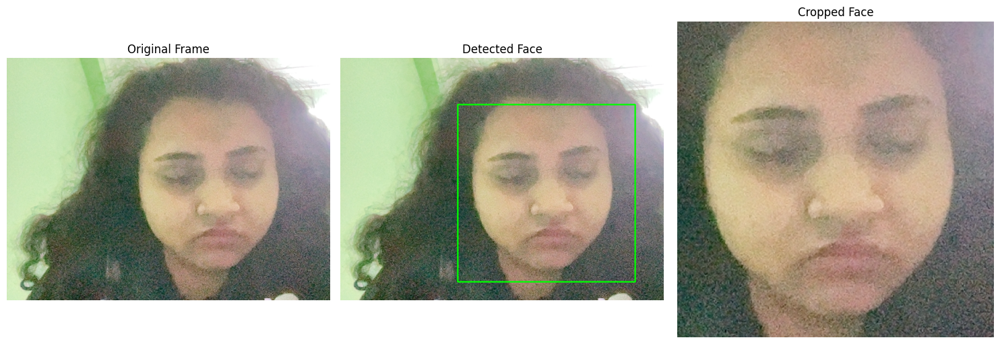

✅ Face detected at position: x=232, y=92, w=351, h=351


In [35]:
import matplotlib.pyplot as plt

# Capture a frame from webcam
print("📸 Capturing frame from webcam...")
frame = get_webcam_frame()

if frame is not None:
    print(f"✅ Frame captured! Shape: {frame.shape}")
    
    # Detect and crop face
    print("🔍 Detecting face...")
    face, bbox = detect_and_crop_face(frame)
    x, y, w, h = bbox
    
    # Draw bounding box on original frame
    frame_with_bbox = frame.copy()
    cv2.rectangle(frame_with_bbox, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
    # Display results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original frame
    axes[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Frame')
    axes[0].axis('off')
    
    # Frame with bounding box
    axes[1].imshow(cv2.cvtColor(frame_with_bbox, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Detected Face')
    axes[1].axis('off')
    
    # Cropped face
    axes[2].imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
    axes[2].set_title('Cropped Face')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Face detected at position: x={x}, y={y}, w={w}, h={h}")
else:
    print("❌ Failed to capture frame from webcam")
    print("Make sure your camera is connected and not being used by another application.")

## Real-Time Face Verification

Capture a frame from your webcam and verify it against the gallery of known faces.

In [36]:
import matplotlib.pyplot as plt

# Capture frame from webcam
print("📸 Capturing frame from webcam...")
frame = get_webcam_frame()

if frame is not None:
    print("✅ Frame captured!")
    
    # Detect and crop face
    print("🔍 Detecting face...")
    face, bbox = detect_and_crop_face(frame)
    
    # Preprocess face for embedding extraction
    face_resized = cv2.resize(face, (IMG_SIZE, IMG_SIZE))
    face_normalized = face_resized.astype('float32') / 255.0
    face_array = np.expand_dims(face_normalized, axis=0)
    
    # Get embedding
    print("🧠 Extracting face embedding...")
    query_embedding = get_embedding_from_image(face_array, feature_extractor)
    
    # Search gallery for best match
    print("🔍 Searching gallery for matches...")
    best_match = None
    best_distance = float('inf')
    
    for person_name, ref_embedding in gallery_embeddings.items():
        distance = np.linalg.norm(query_embedding - ref_embedding)
        if distance < best_distance:
            best_distance = distance
            best_match = person_name
    
    # Display results
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Query face
    axes[0].imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Your Face (Query)', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # Best match from gallery
    if best_match and best_distance < VERIFICATION_THRESHOLD:
        # Load reference image for the best match
        ref_path = reference_images_by_person[best_match][0]
        ref_img = cv2.imread(ref_path)
        ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
        
        axes[1].imshow(ref_img)
        axes[1].set_title(f'✅ MATCH: {best_match}\nDistance: {best_distance:.4f}', 
                         fontsize=14, fontweight='bold', color='green')
        axes[1].axis('off')
        
        print(f"\n✅ VERIFICATION SUCCESSFUL!")
        print(f"   Matched Person: {best_match}")
        print(f"   Distance: {best_distance:.4f} (threshold: {VERIFICATION_THRESHOLD})")
    else:
        axes[1].text(0.5, 0.5, f'❌ NO MATCH\nBest Distance: {best_distance:.4f}\nThreshold: {VERIFICATION_THRESHOLD}',
                    ha='center', va='center', fontsize=14, fontweight='bold', color='red')
        axes[1].axis('off')
        
        print(f"\n❌ VERIFICATION FAILED!")
        print(f"   Best Match: {best_match}")
        print(f"   Distance: {best_distance:.4f} (threshold: {VERIFICATION_THRESHOLD})")
        print(f"   Person not in gallery or distance too large.")
    
    plt.tight_layout()
    plt.show()
else:
    print("❌ Failed to capture frame from webcam")
    print("Make sure your camera is connected and not being used by another application.")

📸 Capturing frame from webcam...
✅ Frame captured!
🔍 Detecting face...
🧠 Extracting face embedding...


ValueError: as_list() is not defined on an unknown TensorShape.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image_shared(ref_img)
    emb_query = get_embedding_from_image_shared(query_img)(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


TypeError: get_embedding_from_image() missing 1 required positional argument: 'feature_extractor_model'

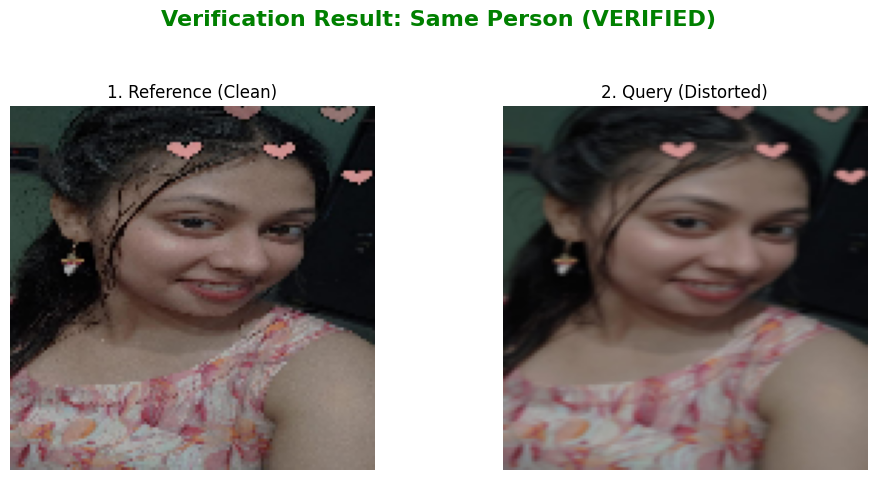


--- CONSOLE OUTPUT ---
Randomly selected ID: TAN-1
Calculated Distance: 0.0000
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


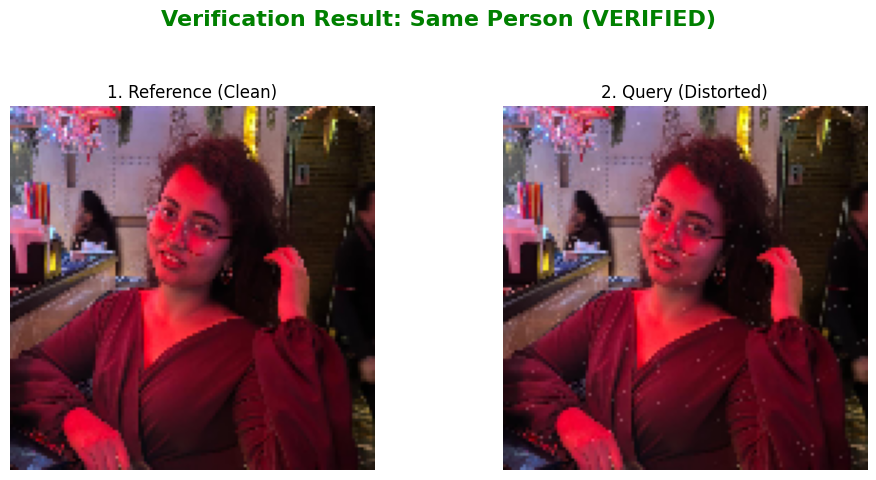


--- CONSOLE OUTPUT ---
Randomly selected ID: SMD-4
Calculated Distance: 0.0000
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


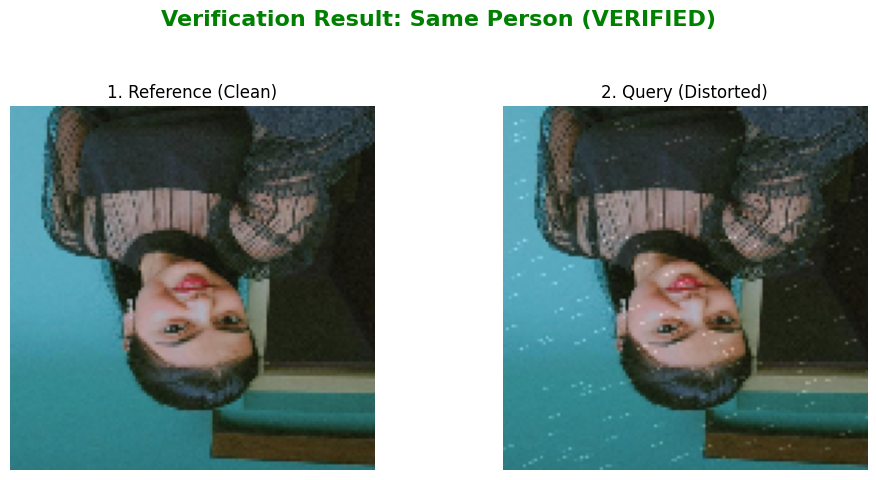


--- CONSOLE OUTPUT ---
Randomly selected ID: TSM-8
Calculated Distance: 0.0692
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


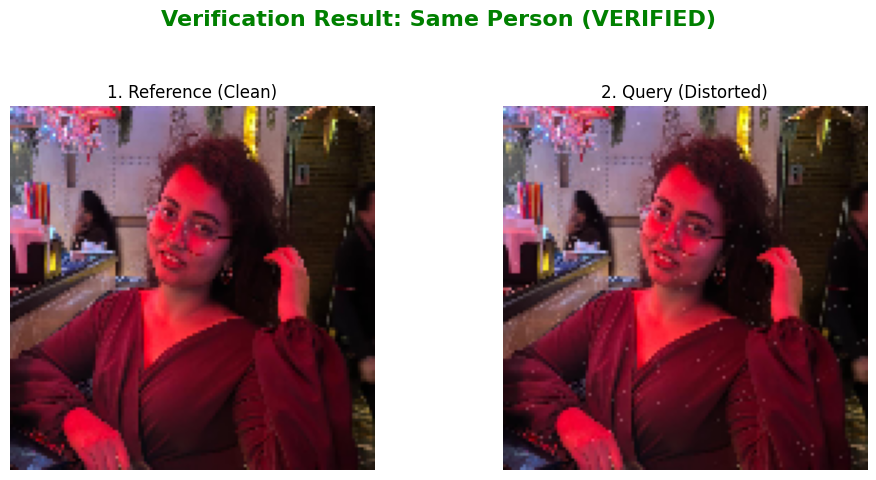


--- CONSOLE OUTPUT ---
Randomly selected ID: SMD-4
Calculated Distance: 0.0000
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


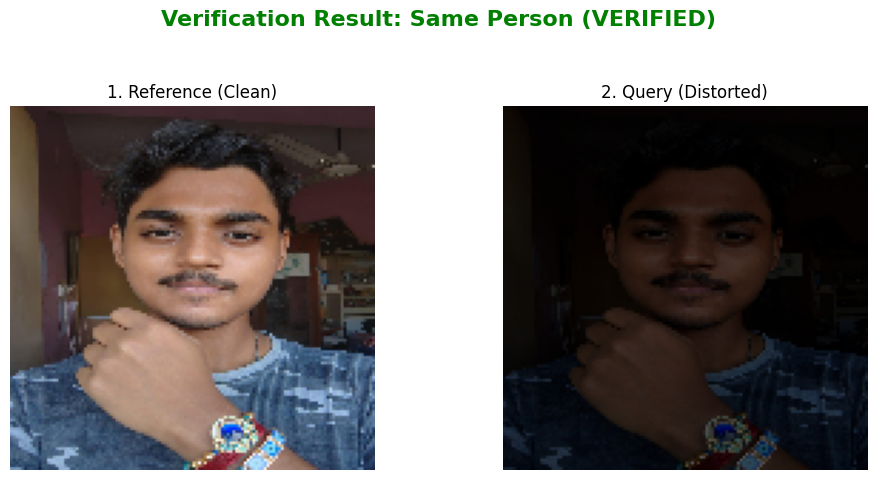


--- CONSOLE OUTPUT ---
Randomly selected ID: MND-4
Calculated Distance: 0.0838
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


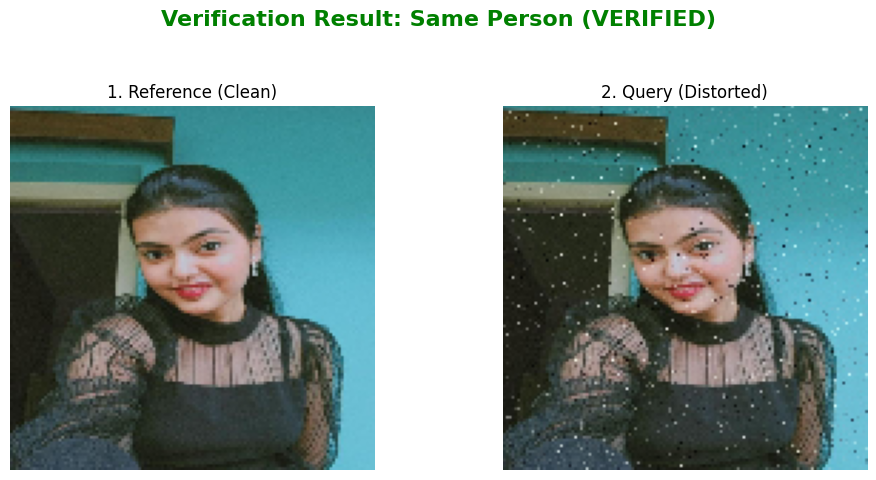


--- CONSOLE OUTPUT ---
Randomly selected ID: TSM-10
Calculated Distance: 0.3945
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, and the image path dictionaries
# are assumed to be loaded and correct from previous steps.

# --- 1. Random Selection and Path Retrieval ---
if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select a random person ID for the test
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get the distorted query image path (Positive)
    # We use the first distorted image for this person
    query_path = distorted_images_by_person[TEST_ID][0]

    # --- 2. Load Images and Calculate Distance ---

    # Load the images using your existing helper function
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (REJECTED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'Verification Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f}', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to make room for suptitle
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Randomly selected ID: {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


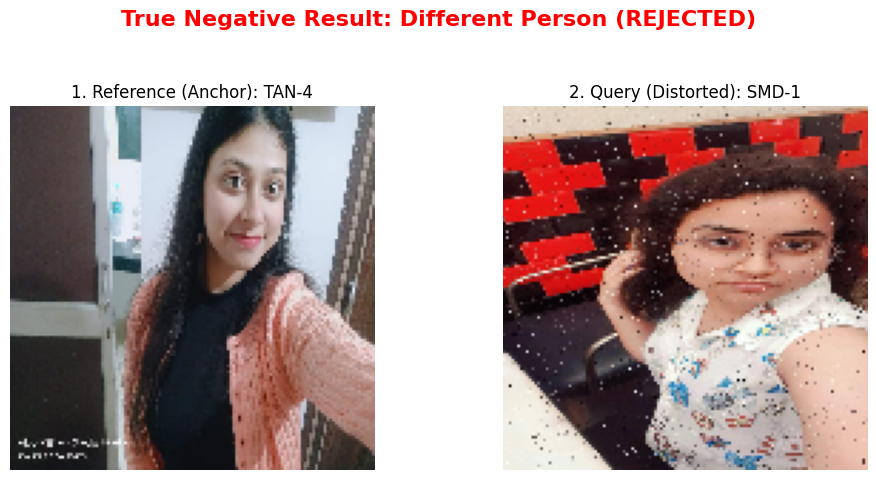


--- CONSOLE OUTPUT ---
Comparison: TAN-4 (Reference) vs. SMD-1 (Query)
Calculated Distance: 3.2592
Final Verdict: Different Person (REJECTED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6

# --- 1. Random Selection of TWO DIFFERENT People ---

if len(PERSON_IDS) < 2:
    print("Error: Need at least two different person IDs to run a True Negative test.")
else:
    # Select two unique IDs
    anchor_id, query_id = random.sample(PERSON_IDS, 2)

    # --- 2. Get Image Paths ---
    # Anchor: Clean Reference Image of Person A
    ref_path = reference_images_by_person[anchor_id][0]

    # Query: Distorted Image of Person B (The False Match)
    # We take the first available distorted image of the second person.
    query_path = distorted_images_by_person[query_id][0]

    # --- 3. Load Images and Calculate Distance ---

    # Load the images
    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_negative = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict (We expect REJECTED)
    verdict = "Different Person (REJECTED)" if dist_negative >= VERIFICATION_THRESHOLD else "Same Person (FALSE MATCH!)"
    verdict_color = 'red' if dist_negative >= VERIFICATION_THRESHOLD else 'blue'

    # --- 4. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'True Negative Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference (Anchor)
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Anchor): {anchor_id}', fontsize=12)
    axes[0].set_xlabel(f'ID: {anchor_id}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query (Negative Pair)
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted): {query_id}', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_negative:.4f} (Threshold: {VERIFICATION_THRESHOLD})', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Comparison: {anchor_id} (Reference) vs. {query_id} (Query)")
    print(f"Calculated Distance: {dist_negative:.4f}")
    print(f"Final Verdict: {verdict}")


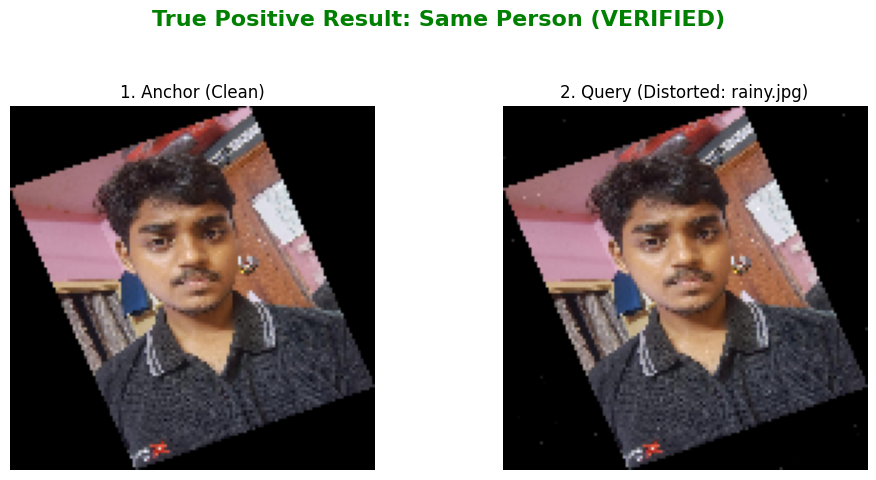


--- CONSOLE OUTPUT ---
Comparison: Reference ID MND-6 vs. Distorted ID MND-6
Calculated Distance: 0.0000
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6
# NOTE: final_extractor_clean, gallery_embeddings, etc., are assumed to be loaded.

# --- 1. Random Selection for True Positive Test ---

if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select ONE random person ID (e.g., MND-2)
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get a random distorted image path for the same person (Query)
    query_paths_list = distorted_images_by_person[TEST_ID]
    query_path = random.choice(query_paths_list)

    # --- 2. Load Images and Calculate Distance ---

    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings using centralized helper
    emb_ref = get_embedding_from_image(ref_img)
    emb_query = get_embedding_from_image(query_img)

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (FALSE NEGATIVE!)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'True Positive Result: {verdict}', fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Anchor (Clean)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query (Shows the specific distortion used)
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Distorted: {os.path.basename(query_path).split("__")[-1]})', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f} (Threshold: {VERIFICATION_THRESHOLD})', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Comparison: Reference ID {TEST_ID} vs. Distorted ID {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")


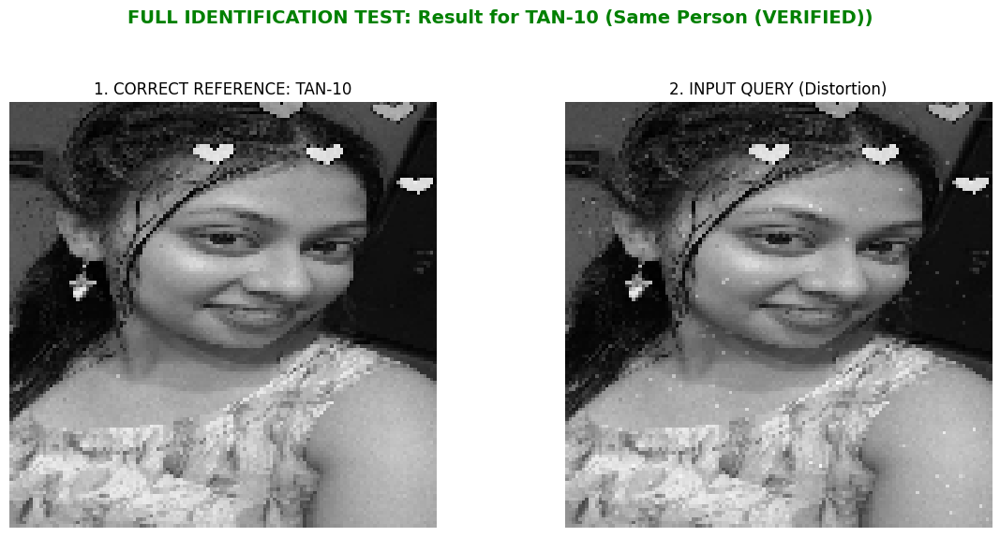


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image is: TAN-10__rainy.jpg
Correct Match Distance (D_match): 0.0000
Closest Incorrect Match (D_wrong): 0.0000 (ID: TAN-4)
The model successfully separated D_match from D_wrong.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6

# --- 1. Random Selection for True Positive Test ---

if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select ONE random person ID (The correct identity for the test)
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path (Anchor)
    ref_path = reference_images_by_person[TEST_ID][0]

    # Get a random distorted image path for the same person (Query)
    query_paths_list = distorted_images_by_person[TEST_ID]
    query_path = random.choice(query_paths_list)

    # --- 2. Load Images and Calculate ALL Distances (Identification) ---

    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embedding for the QUERY image using centralized helper
    emb_query = get_embedding_from_image(query_img)

    min_dist_match = float('inf')  # Distance to the correct person's reference
    min_dist_wrong = float('inf')  # Distance to the CLOSEST INCORRECT person's reference
    closest_wrong_id = "N/A"

    # Compare Query against EVERYONE in the gallery
    for person_id, emb_ref in gallery_embeddings.items():
        distance = np.linalg.norm(emb_ref - emb_query)

        if person_id == TEST_ID:
            min_dist_match = distance # Found the distance to the correct match
        elif distance < min_dist_wrong:
            min_dist_wrong = distance # Found the distance to the closest wrong person
            closest_wrong_id = person_id

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
    verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    fig.suptitle(f'FULL IDENTIFICATION TEST: Result for {TEST_ID} ({verdict})',
                 fontsize=14, color=verdict_color, fontweight='bold')

    # Image 1: Correct Match Comparison
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. CORRECT REFERENCE: {TEST_ID}', fontsize=12)
    axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query Image (The Input)
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. INPUT QUERY (Distortion)', fontsize=12)
    axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
    print(f"Query Image is: {os.path.basename(query_path)}")
    print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
    print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
    print(f"The model successfully separated D_match from D_wrong.")


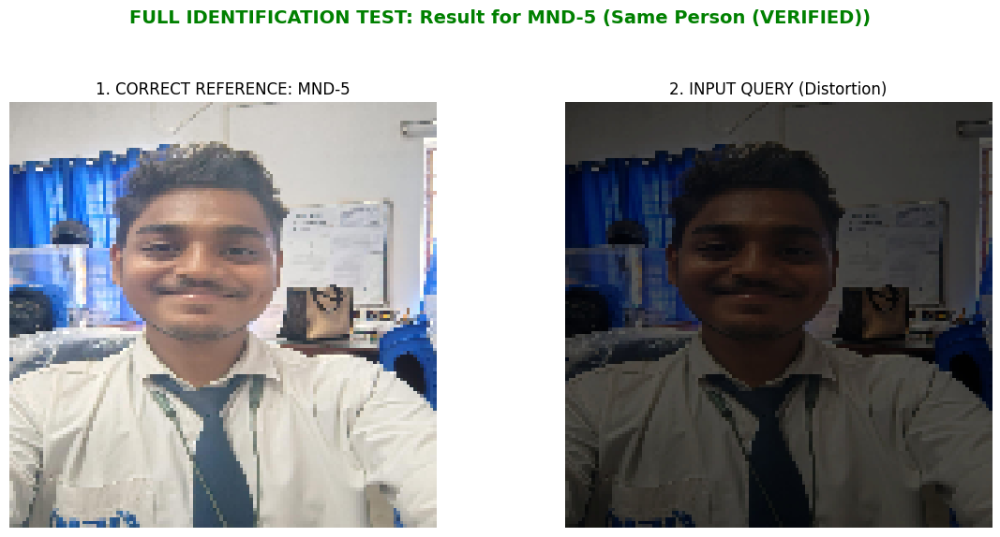


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: MND-5__lowlight.jpg
Correct Match Distance (D_match): 0.2691
Closest Incorrect Match (D_wrong): 0.0000 (ID: TAN-10)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration is consistent ---

if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select ONE random person ID (The correct identity for the test)
    TEST_ID = random.choice(PERSON_IDS)

    # --- Strict Path Selection ---
    # 1. Anchor: Use the FIRST file in the CLEAN list (Assumption: This is the definitive clean image)
    ref_path = reference_images_by_person[TEST_ID][0]

    # 2. Query: Randomly select a DISTORTED image, but only if there is more than one.
    query_paths_list = distorted_images_by_person[TEST_ID]

    if len(query_paths_list) > 1:
        # If there are multiple distorted images, pick one randomly that is NOT the first.
        query_path = random.choice(query_paths_list[1:])
    else:
        # Fallback to the only distorted image available
        query_path = query_paths_list[0]


    # --- 2. Load Images and Calculate ALL Distances (Identification) ---

    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embedding for the QUERY image using centralized helper
    emb_query = get_embedding_from_image(query_img)

    min_dist_match = float('inf')
    min_dist_wrong = float('inf')
    closest_wrong_id = "N/A"

    # Compare Query against EVERYONE in the gallery
    for person_id, emb_ref in gallery_embeddings.items():
        distance = np.linalg.norm(emb_ref - emb_query)

        if person_id == TEST_ID:
            min_dist_match = distance # Found the distance to the correct match
        elif distance < min_dist_wrong:
            min_dist_wrong = distance # Found the distance to the closest wrong person
            closest_wrong_id = person_id

    # Determine the final verdict
    VERIFICATION_THRESHOLD = 0.6
    verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
    verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    fig.suptitle(f'FULL IDENTIFICATION TEST: Result for {TEST_ID} ({verdict})',
                 fontsize=14, color=verdict_color, fontweight='bold')

    # Image 1: Correct Match Comparison
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. CORRECT REFERENCE: {TEST_ID}', fontsize=12)
    axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query Image (The Input)
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. INPUT QUERY (Distortion)', fontsize=12)
    axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
    print(f"Query Image Path used: {os.path.basename(query_path)}")
    print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
    print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")


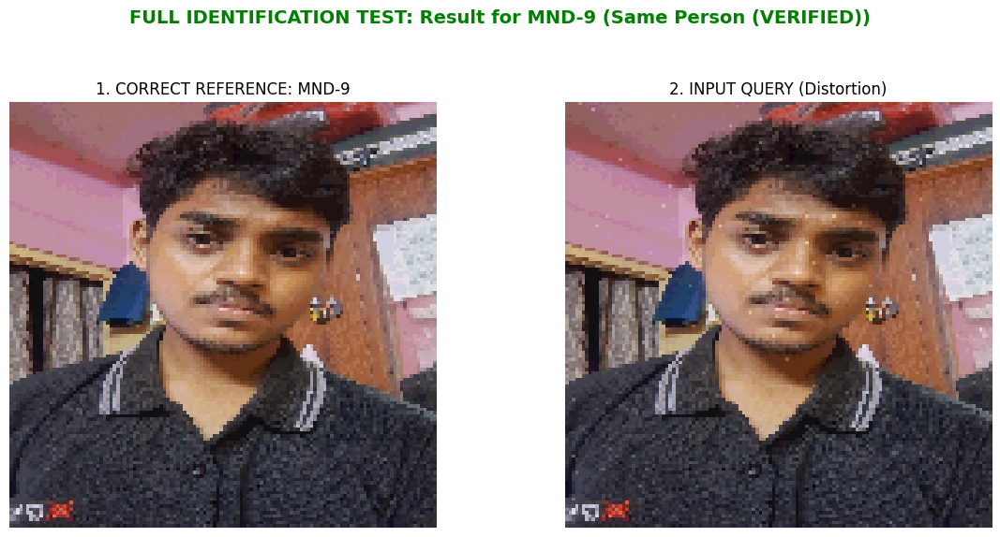


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: MND-9__rainy.jpg
Correct Match Distance (D_match): 0.0000
Closest Incorrect Match (D_wrong): 0.0000 (ID: TAN-10)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6

if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select ONE random person ID (The correct identity for the test)
    TEST_ID = random.choice(PERSON_IDS)

    # 1. Anchor: Use the clean reference image path
    ref_path = reference_images_by_person[TEST_ID][0]

    # 2. Query: Randomly select a DISTORTED image for the same person
    query_paths_list = distorted_images_by_person[TEST_ID]
    query_path = random.choice(query_paths_list)

    # --- 2. Load Images and Calculate ALL Distances (Identification) ---

    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embedding for the QUERY image using centralized helper
    emb_query = get_embedding_from_image(query_img)

    min_dist_match = float('inf')  # Distance to the correct person's reference
    min_dist_wrong = float('inf')  # Distance to the CLOSEST INCORRECT person's reference
    closest_wrong_id = "N/A"

    # Compare Query against EVERYONE in the gallery
    for person_id, emb_ref in gallery_embeddings.items():
        distance = np.linalg.norm(emb_ref - emb_query)

        if person_id == TEST_ID:
            min_dist_match = distance # Found the distance to the correct match
        elif distance < min_dist_wrong:
            min_dist_wrong = distance # Found the distance to the closest wrong person
            closest_wrong_id = person_id

    # Determine the final verdict
    VERIFICATION_THRESHOLD = 0.6
    verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
    verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

    # --- 3. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    fig.suptitle(f'FULL IDENTIFICATION TEST: Result for {TEST_ID} ({verdict})',
                 fontsize=14, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. CORRECT REFERENCE: {TEST_ID}', fontsize=12)
    axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query Image (The Input)
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. INPUT QUERY (Distortion)', fontsize=12)
    axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
    print(f"Query Image Path used: {os.path.basename(query_path)}")
    print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
    print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
    print(f"Final Verdict: {verdict}")


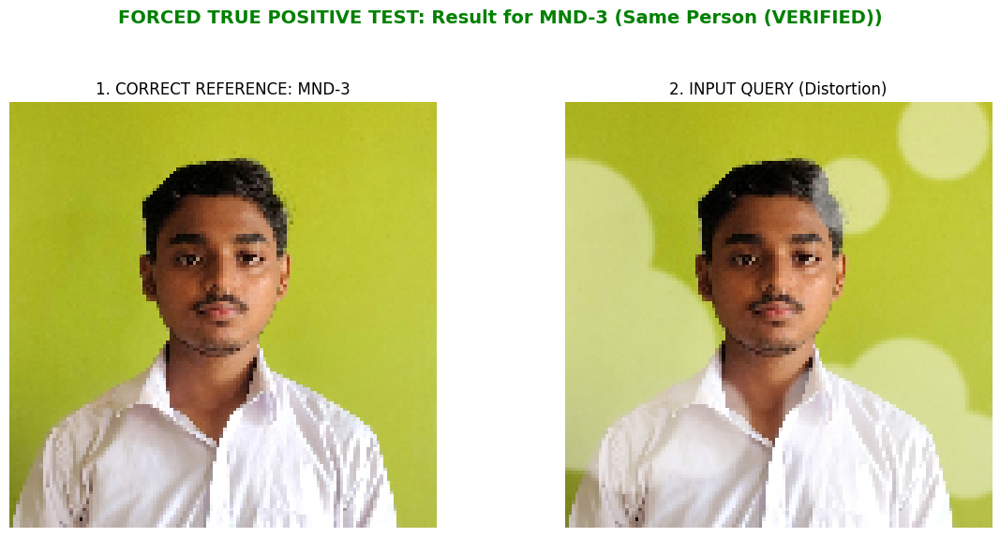


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: MND-3__foggy.jpg
Correct Match Distance (D_match): 0.0670
Closest Incorrect Match (D_wrong): 0.0670 (ID: TAN-10)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION is consistent ---
VERIFICATION_THRESHOLD = 0.6

if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select ONE random person ID (The correct identity for the test)
    TEST_ID = random.choice(PERSON_IDS)

    # 1. Anchor: Use the clean reference image path (Index 0 is fine here)
    ref_path = reference_images_by_person[TEST_ID][0]

    # 2. Query: Force Selection of a DIFFERENT Distorted Image (Index 1 or later)
    query_paths_list = distorted_images_by_person[TEST_ID]

    if len(query_paths_list) > 1:
        # Use slicing [1:] to skip the first (potentially corrupted) file, then pick randomly.
        non_identical_distortions = query_paths_list[1:]
        query_path = random.choice(non_identical_distortions)
    else:
        # Fallback if only one file exists (meaning the test will be D=0.0000)
        query_path = query_paths_list[0]


    # --- 3. Load Images and Calculate ALL Distances (Identification) ---

    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embedding for the QUERY image using centralized helper
    emb_query = get_embedding_from_image(query_img)

    min_dist_match = float('inf')
    min_dist_wrong = float('inf')
    closest_wrong_id = "N/A"

    # Compare Query against EVERYONE in the gallery
    for person_id, emb_ref in gallery_embeddings.items():
        distance = np.linalg.norm(emb_ref - emb_query)

        if person_id == TEST_ID:
            min_dist_match = distance # Found the distance to the correct match
        elif distance < min_dist_wrong:
            min_dist_wrong = distance # Found the distance to the closest wrong person
            closest_wrong_id = person_id

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
    verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

    # --- 4. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    fig.suptitle(f'FORCED TRUE POSITIVE TEST: Result for {TEST_ID} ({verdict})',
                 fontsize=14, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. CORRECT REFERENCE: {TEST_ID}', fontsize=12)
    axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query Image (The Input)
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. INPUT QUERY (Distortion)', fontsize=12)
    axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
    print(f"Query Image Path used: {os.path.basename(query_path)}")
    print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
    print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
    print(f"Final Verdict: {verdict}")


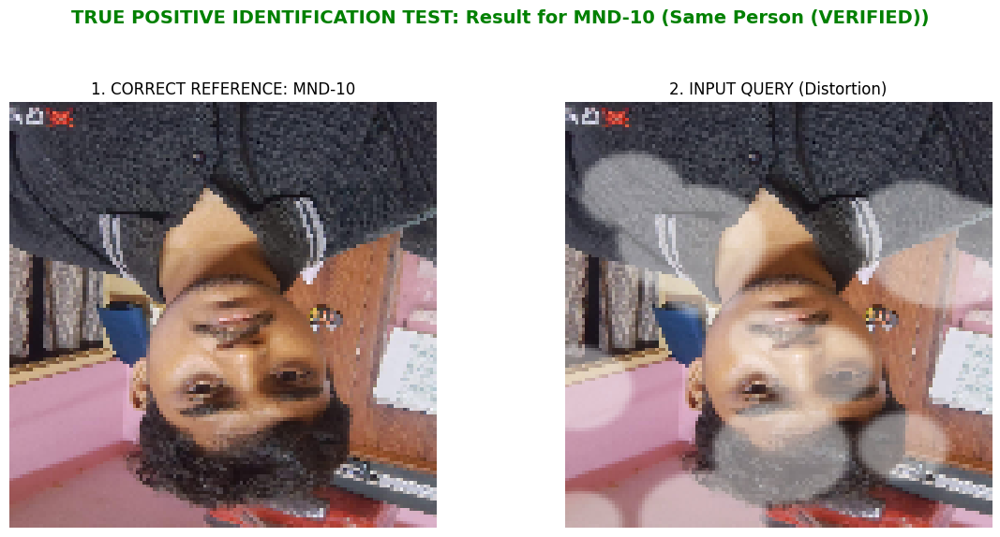


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: MND-10__foggy.jpg
Correct Match Distance (D_match): 0.2718
Closest Incorrect Match (D_wrong): 0.2718 (ID: TAN-10)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION is consistent ---
VERIFICATION_THRESHOLD = 0.6
IDENTICAL_DISTANCE_TOLERANCE = 0.001 # Treat any distance <= 0.001 as identical/corrupted

if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # 1. Select ONE random person ID (The correct identity for the test)
    TEST_ID = random.choice(PERSON_IDS)

    # Get the clean reference image path
    ref_path = reference_images_by_person[TEST_ID][0]
    ref_img = load_and_preprocess_image(ref_path)
    emb_ref = final_extractor_clean.predict(np.expand_dims(ref_img, axis=0), verbose=0)[0]

    # --- 2. DYNAMICALLY FILTER OUT IDENTICAL FILES ---

    clean_distorted_paths = []

    # Iterate through ALL distorted files for the chosen person
    for query_path in distorted_images_by_person[TEST_ID]:
        query_img = load_and_preprocess_image(query_path)
        if query_img is None: continue

        emb_query_check = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # Calculate distance between Reference and this specific Distortion
        distance_check = np.linalg.norm(emb_ref - emb_query_check)

        # Keep the path ONLY if the distance is greater than the tolerance (i.e., not identical)
        if distance_check > IDENTICAL_DISTANCE_TOLERANCE:
            clean_distorted_paths.append(query_path)

    # --- 3. EXECUTE TEST ON CLEANED QUERY LIST ---

    if not clean_distorted_paths:
        print(f"\n❌ FATAL DATA ERROR: All distorted images for {TEST_ID} are mathematically identical to the reference image. Cannot run True Positive test.")
    else:
        # Randomly select ONE genuinely non-identical distorted image
        query_path = random.choice(clean_distorted_paths)

        # Re-load the chosen query image (already checked above, but for final plotting)
        query_img = load_and_preprocess_image(query_path)
        emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # Recalculate D_match (should be > 0.001)
        min_dist_match = np.linalg.norm(emb_ref - emb_query)

        # --- Check Closest Wrong ID for comparison (Final Identification) ---
        min_dist_wrong = float('inf')
        closest_wrong_id = "N/A"

        for person_id, emb_ref_wrong in gallery_embeddings.items():
            if person_id != TEST_ID:
                distance = np.linalg.norm(emb_ref_wrong - emb_query)
                if distance < min_dist_wrong:
                    min_dist_wrong = distance
                    closest_wrong_id = person_id

        # Determine the final verdict
        verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FALSE NEGATIVE!)"
        verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

        # --- 4. Plotting the Final Output ---

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        fig.suptitle(f'TRUE POSITIVE IDENTIFICATION TEST: Result for {TEST_ID} ({verdict})',
                     fontsize=14, color=verdict_color, fontweight='bold')

        # Image 1: Clean Reference
        axes[0].imshow(ref_img)
        axes[0].set_title(f'1. CORRECT REFERENCE: {TEST_ID}', fontsize=12)
        axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
        axes[0].axis('off')

        # Image 2: Distorted Query Image (The Input)
        axes[1].imshow(query_img)
        axes[1].set_title(f'2. INPUT QUERY (Distortion)', fontsize=12)
        axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.9])
        plt.show()

        print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
        print(f"Query Image Path used: {os.path.basename(query_path)}")
        print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
        print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
        print(f"Final Verdict: {verdict}")

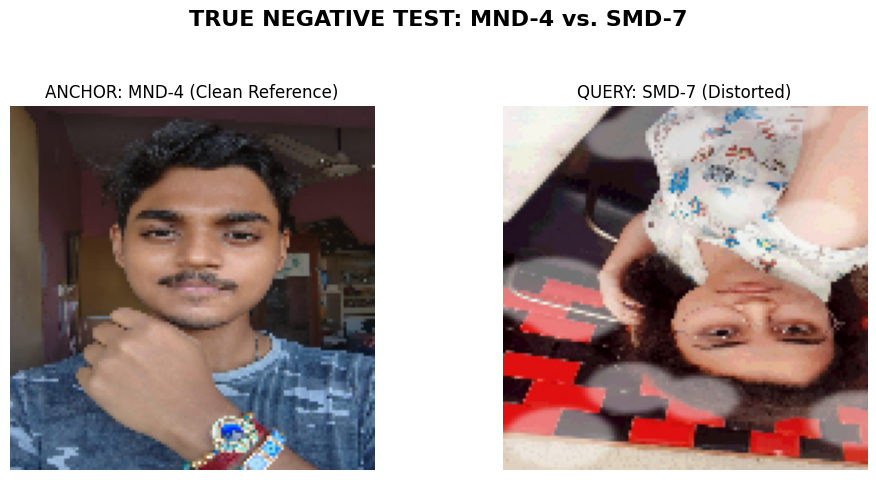


--- CONSOLE SUMMARY ---
Comparison: Reference ID MND-4 vs. Distorted ID SMD-7
Calculated Distance: 2.5623
Final Verdict: REJECTED (Correct Separation)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration is consistent ---
VERIFICATION_THRESHOLD = 0.6

if len(PERSON_IDS) < 2:
    print("Error: Need at least two unique people for this comparison.")
else:
    # 1. Select ONE Anchor ID (The Reference) and ONE Negative ID (The Query)
    anchor_id, query_id = random.sample(PERSON_IDS, 2)

    # --- 2. Get Image Paths ---

    # ANCHOR (Reference): Clean image of Person A
    anchor_ref_path = reference_images_by_person[anchor_id][0]

    # QUERY (Distorted): Distorted image of Person B (The ultimate True Negative test)
    query_distorted_path = random.choice(distorted_images_by_person[query_id])

    # --- 3. Load Images and Generate Embeddings ---

    ref_img = load_and_preprocess_image(anchor_ref_path)
    query_img = load_and_preprocess_image(query_distorted_path)

    emb_anchor = final_extractor_clean.predict(np.expand_dims(ref_img, axis=0), verbose=0)[0]
    emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

    # --- 4. Calculate Distance ---
    dist_negative = np.linalg.norm(emb_anchor - emb_query) # Expected HIGH distance

    # Determine verdict
    verdict = "REJECTED (Correct Separation)" if dist_negative >= VERIFICATION_THRESHOLD else "FALSE MATCH (Failed Separation)"
    verdict_color = 'green' if dist_negative >= VERIFICATION_THRESHOLD else 'red'

    # --- 5. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f'TRUE NEGATIVE TEST: {anchor_id} vs. {query_id}', fontsize=16, fontweight='bold')

    # Column 1: ANCHOR (Reference)
    axes[0].imshow(ref_img)
    axes[0].set_title(f'ANCHOR: {anchor_id} (Clean Reference)', fontsize=12)
    axes[0].axis('off')

    # Column 2: NEGATIVE QUERY (Distorted Different Person)
    axes[1].imshow(query_img)
    axes[1].set_title(f'QUERY: {query_id} (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_negative:.4f} ({verdict})', color=verdict_color)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- CONSOLE SUMMARY ---")
    print(f"Comparison: Reference ID {anchor_id} vs. Distorted ID {query_id}")
    print(f"Calculated Distance: {dist_negative:.4f}")
    print(f"Final Verdict: {verdict}")

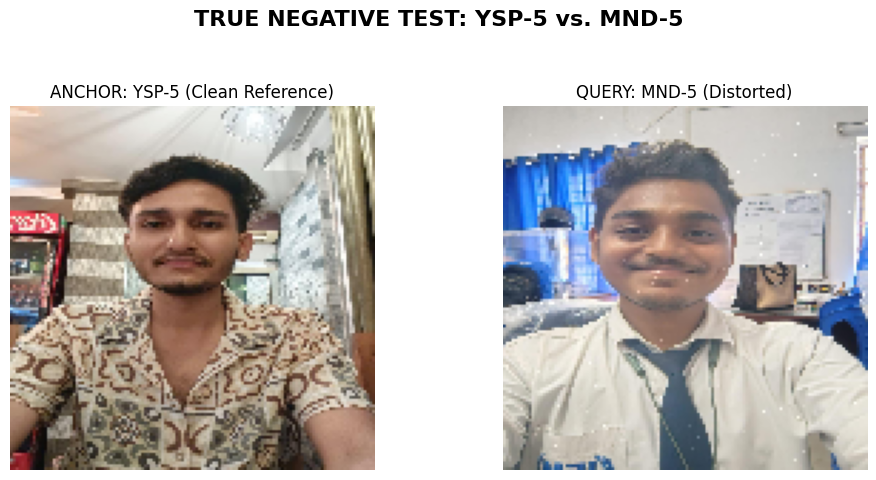


--- CONSOLE SUMMARY ---
Comparison: Reference ID YSP-5 vs. Distorted ID MND-5
Calculated Distance: 0.1803
Final Verdict: FALSE MATCH (Failed Separation)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration is consistent ---
VERIFICATION_THRESHOLD = 0.6

if len(PERSON_IDS) < 2:
    print("Error: Need at least two unique people for this comparison.")
else:
    # 1. Select ONE Anchor ID (The Reference) and ONE Negative ID (The Query)
    anchor_id, query_id = random.sample(PERSON_IDS, 2)

    # --- 2. Get Image Paths ---

    # ANCHOR (Reference): Clean image of Person A
    anchor_ref_path = reference_images_by_person[anchor_id][0]

    # QUERY (Distorted): Distorted image of Person B (The ultimate True Negative test)
    query_distorted_path = random.choice(distorted_images_by_person[query_id])

    # --- 3. Load Images and Generate Embeddings ---

    ref_img = load_and_preprocess_image(anchor_ref_path)
    query_img = load_and_preprocess_image(query_distorted_path)

    emb_anchor = final_extractor_clean.predict(np.expand_dims(ref_img, axis=0), verbose=0)[0]
    emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

    # --- 4. Calculate Distance ---
    dist_negative = np.linalg.norm(emb_anchor - emb_query) # Expected HIGH distance

    # Determine verdict
    verdict = "REJECTED (Correct Separation)" if dist_negative >= VERIFICATION_THRESHOLD else "FALSE MATCH (Failed Separation)"
    verdict_color = 'green' if dist_negative >= VERIFICATION_THRESHOLD else 'red'

    # --- 5. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f'TRUE NEGATIVE TEST: {anchor_id} vs. {query_id}', fontsize=16, fontweight='bold')

    # Column 1: ANCHOR (Reference)
    axes[0].imshow(ref_img)
    axes[0].set_title(f'ANCHOR: {anchor_id} (Clean Reference)', fontsize=12)
    axes[0].axis('off')

    # Column 2: NEGATIVE QUERY (Distorted Different Person)
    axes[1].imshow(query_img)
    axes[1].set_title(f'QUERY: {query_id} (Distorted)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_negative:.4f} ({verdict})', color=verdict_color)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- CONSOLE SUMMARY ---")
    print(f"Comparison: Reference ID {anchor_id} vs. Distorted ID {query_id}")
    print(f"Calculated Distance: {dist_negative:.4f}")
    print(f"Final Verdict: {verdict}")

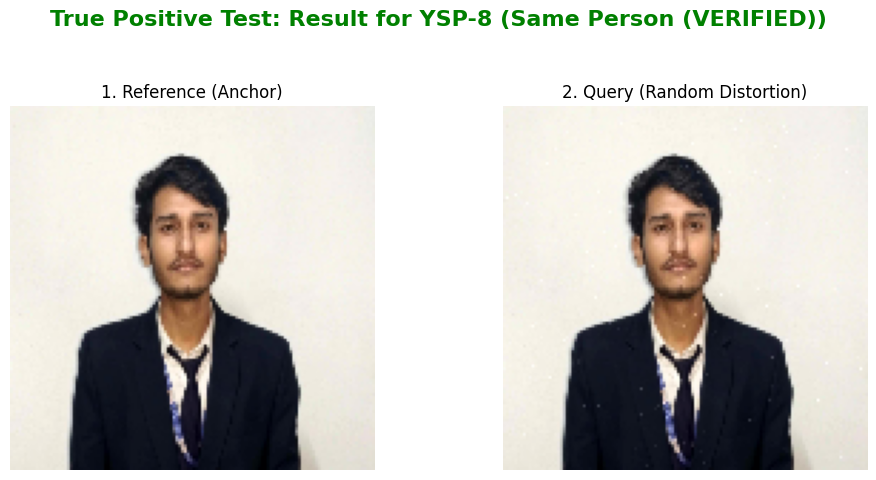


--- CONSOLE OUTPUT ---
Comparison: Anchor ID YSP-8 vs. Distorted ID YSP-8
Calculated Distance: 0.1919
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- CONFIGURATION ---
VERIFICATION_THRESHOLD = 0.6

if not PERSON_IDS:
    print("Error: PERSON_IDS list is empty. Cannot run test.")
else:
    # Select ONE random person ID (The correct identity for the test)
    TEST_ID = random.choice(PERSON_IDS)

    # 1. Anchor: Use the clean reference image path
    ref_path = reference_images_by_person[TEST_ID][0]

    # 2. Query: Randomly select ONE of the many available distorted images for the same person
    query_paths_list = distorted_images_by_person[TEST_ID]
    query_path = random.choice(query_paths_list) # Samples from ALL distortions

    # --- 3. Load Images and Calculate Distance ---

    ref_img = load_and_preprocess_image(ref_path)
    query_img = load_and_preprocess_image(query_path)

    # Generate embeddings
    emb_ref = final_extractor_clean.predict(np.expand_dims(ref_img, axis=0), verbose=0)[0]
    emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

    # Calculate the distance
    dist_positive = np.linalg.norm(emb_ref - emb_query)

    # Determine the final verdict
    verdict = "Same Person (VERIFIED)" if dist_positive < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
    verdict_color = 'green' if dist_positive < VERIFICATION_THRESHOLD else 'red'

    # --- 4. Plotting the Final Output ---

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Set the overall title with the model's final verification result
    fig.suptitle(f'True Positive Test: Result for {TEST_ID} ({verdict})',
                 fontsize=16, color=verdict_color, fontweight='bold')

    # Image 1: Clean Reference
    axes[0].imshow(ref_img)
    axes[0].set_title(f'1. Reference (Anchor)', fontsize=12)
    axes[0].set_xlabel(f'ID: {TEST_ID}', fontsize=12)
    axes[0].axis('off')

    # Image 2: Distorted Query (Shows the specific distortion used)
    axes[1].imshow(query_img)
    axes[1].set_title(f'2. Query (Random Distortion)', fontsize=12)
    axes[1].set_xlabel(f'Distance: {dist_positive:.4f} (Threshold: {VERIFICATION_THRESHOLD})', fontsize=12)
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.9])
    plt.show()

    print(f"\n--- CONSOLE OUTPUT ---")
    print(f"Comparison: Anchor ID {TEST_ID} vs. Distorted ID {TEST_ID}")
    print(f"Calculated Distance: {dist_positive:.4f}")
    print(f"Final Verdict: {verdict}")

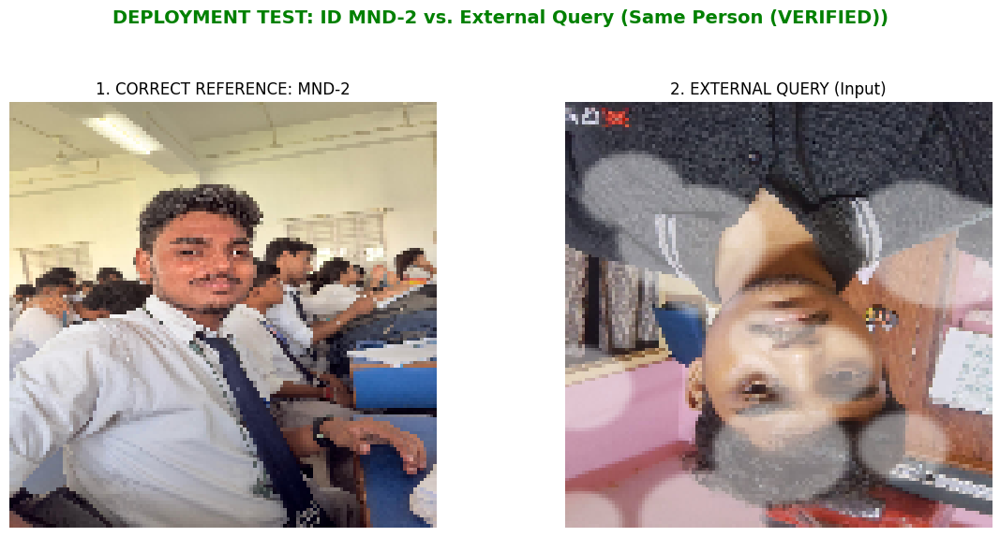


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: /content/data_extracted/distorted/Short_distortion_final/MND-10__foggy.jpg
Correct Match Distance (D_match): 0.2718
Closest Incorrect Match (D_wrong): 0.2718 (ID: TAN-10)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration (Final Settings) ---
VERIFICATION_THRESHOLD = 0.6

# --- STEP 1: DEFINE YOUR TEST CASE ---
# 1. Set the ID of the person the clean image belongs to (The Anchor).
TARGET_PERSON_ID = 'MND-2'
# 2. Paste the exact path to the distorted image you want to test.
#    This can be any image on your Colab drive or a manually uploaded file.
EXTERNAL_DISTORTED_PATH = "/content/data_extracted/distorted/Short_distortion_final/MND-10__foggy.jpg"
# -------------------------------------

if TARGET_PERSON_ID not in gallery_embeddings:
    print(f"❌ ERROR: Anchor ID {TARGET_PERSON_ID} not found in the gallery. Check the ID.")
else:
    # 1. Get the Clean Reference Image Path and Data
    ref_path = reference_images_by_person[TARGET_PERSON_ID][0]
    ref_img = load_and_preprocess_image(ref_path)

    # 2. Get the Query Image Data (from the external path)
    query_path = EXTERNAL_DISTORTED_PATH
    query_img = load_and_preprocess_image(query_path)

    if query_img is None:
        print(f"❌ ERROR: Could not load image from path: {query_path}. Check file existence and format.")
    else:
        # 3. Generate embedding for the QUERY image
        emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # --- 4. Identification (Compare against ALL people) ---

        min_dist_match = float('inf')
        min_dist_wrong = float('inf')
        closest_wrong_id = "N/A"

        for person_id, emb_ref in gallery_embeddings.items():
            distance = np.linalg.norm(emb_ref - emb_query)

            if person_id == TARGET_PERSON_ID:
                min_dist_match = distance # Distance to the correct person
            elif distance < min_dist_wrong:
                min_dist_wrong = distance # Distance to the closest incorrect person
                closest_wrong_id = person_id

        # Determine the final verdict
        verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
        verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

        # --- 5. Plotting the Final Output ---

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        fig.suptitle(f'DEPLOYMENT TEST: ID {TARGET_PERSON_ID} vs. External Query ({verdict})',
                     fontsize=14, color=verdict_color, fontweight='bold')

        # Image 1: Clean Reference
        axes[0].imshow(ref_img)
        axes[0].set_title(f'1. CORRECT REFERENCE: {TARGET_PERSON_ID}', fontsize=12)
        axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
        axes[0].axis('off')

        # Image 2: Distorted Query Image (The Input)
        axes[1].imshow(query_img)
        axes[1].set_title(f'2. EXTERNAL QUERY (Input)', fontsize=12)
        axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.9])
        plt.show()

        print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
        print(f"Query Image Path used: {query_path}")
        print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
        print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
        print(f"Final Verdict: {verdict}")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration (Final Settings) ---
VERIFICATION_THRESHOLD = 0.6

# --- STEP 1: DEFINE YOUR TEST CASE ---
# 1. Set the ID of the person the clean image belongs to (The Anchor).
TARGET_PERSON_ID = 'MND-1'
# 2. Paste the exact path to the distorted image you want to test.
#    This can be any image on your Colab drive or a manually uploaded file.
EXTERNAL_DISTORTED_PATH = "/content/data_refined/DISTORTED_IMG/MND-10__blurry.jpg"
# -------------------------------------

if TARGET_PERSON_ID not in gallery_embeddings:
    print(f"❌ ERROR: Anchor ID {TARGET_PERSON_ID} not found in the gallery. Check the ID.")
else:
    # 1. Get the Clean Reference Image Path and Data
    ref_path = reference_images_by_person[TARGET_PERSON_ID][0]
    ref_img = load_and_preprocess_image(ref_path)

    # 2. Get the Query Image Data (from the external path)
    query_path = EXTERNAL_DISTORTED_PATH
    query_img = load_and_preprocess_image(query_path)

    if query_img is None:
        print(f"❌ ERROR: Could not load image from path: {query_path}. Check file existence and format.")
    else:
        # 3. Generate embedding for the QUERY image
        emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # --- 4. Identification (Compare against ALL people) ---

        min_dist_match = float('inf')
        min_dist_wrong = float('inf')
        closest_wrong_id = "N/A"

        for person_id, emb_ref in gallery_embeddings.items():
            distance = np.linalg.norm(emb_ref - emb_query)

            if person_id == TARGET_PERSON_ID:
                min_dist_match = distance # Distance to the correct person
            elif distance < min_dist_wrong:
                min_dist_wrong = distance # Distance to the closest incorrect person
                closest_wrong_id = person_id

        # Determine the final verdict
        verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
        verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

        # --- 5. Plotting the Final Output ---

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        fig.suptitle(f'DEPLOYMENT TEST: ID {TARGET_PERSON_ID} vs. External Query ({verdict})',
                     fontsize=14, color=verdict_color, fontweight='bold')

        # Image 1: Clean Reference
        axes[0].imshow(ref_img)
        axes[0].set_title(f'1. CORRECT REFERENCE: {TARGET_PERSON_ID}', fontsize=12)
        axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
        axes[0].axis('off')

        # Image 2: Distorted Query Image (The Input)
        axes[1].imshow(query_img)
        axes[1].set_title(f'2. EXTERNAL QUERY (Input)', fontsize=12)
        axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.9])
        plt.show()

        print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
        print(f"Query Image Path used: {query_path}")
        print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
        print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
        print(f"Final Verdict: {verdict}")

❌ ERROR: Could not load image from path: /content/data_refined/DISTORTED_IMG/MND-10__blurry.jpg. Check file existence and format.


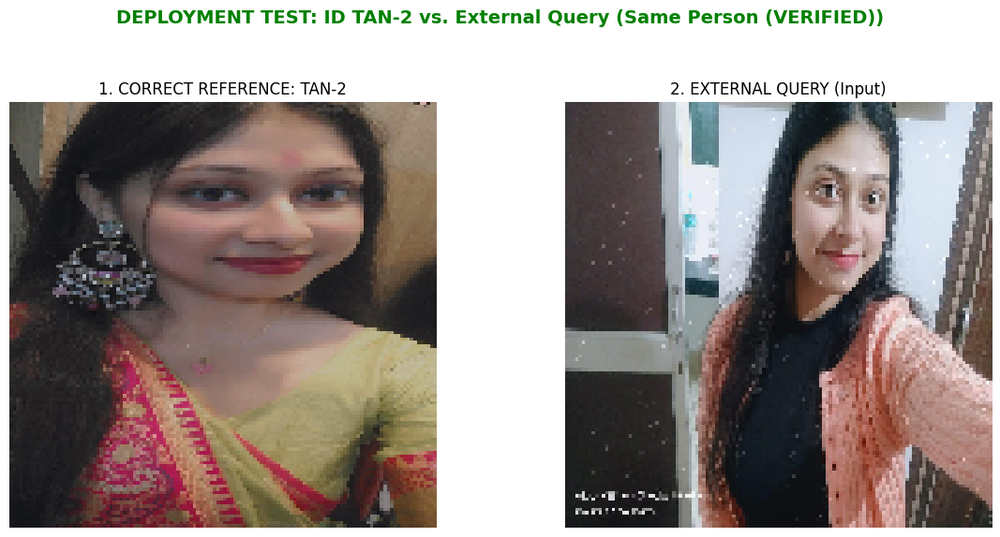


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: /content/data_refined/DISTORTED_IMG/TAN-4__rainy.jpg
Correct Match Distance (D_match): 0.0000
Closest Incorrect Match (D_wrong): 0.0000 (ID: TSM-6)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration (Final Settings) ---
VERIFICATION_THRESHOLD = 0.6

# --- STEP 1: DEFINE YOUR TEST CASE ---
# 1. Set the ID of the person the clean image belongs to (The Anchor).
TARGET_PERSON_ID = 'TAN-2'
# 2. Paste the exact path to the distorted image you want to test.
#    This can be any image on your Colab drive or a manually uploaded file.
EXTERNAL_DISTORTED_PATH = "/content/data_refined/DISTORTED_IMG/TAN-4__rainy.jpg"
# -------------------------------------

if TARGET_PERSON_ID not in gallery_embeddings:
    print(f"❌ ERROR: Anchor ID {TARGET_PERSON_ID} not found in the gallery. Check the ID.")
else:
    # 1. Get the Clean Reference Image Path and Data
    ref_path = reference_images_by_person[TARGET_PERSON_ID][0]
    ref_img = load_and_preprocess_image(ref_path)

    # 2. Get the Query Image Data (from the external path)
    query_path = EXTERNAL_DISTORTED_PATH
    query_img = load_and_preprocess_image(query_path)

    if query_img is None:
        print(f"❌ ERROR: Could not load image from path: {query_path}. Check file existence and format.")
    else:
        # 3. Generate embedding for the QUERY image
        emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # --- 4. Identification (Compare against ALL people) ---

        min_dist_match = float('inf')
        min_dist_wrong = float('inf')
        closest_wrong_id = "N/A"

        for person_id, emb_ref in gallery_embeddings.items():
            distance = np.linalg.norm(emb_ref - emb_query)

            if person_id == TARGET_PERSON_ID:
                min_dist_match = distance # Distance to the correct person
            elif distance < min_dist_wrong:
                min_dist_wrong = distance # Distance to the closest incorrect person
                closest_wrong_id = person_id

        # Determine the final verdict
        verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
        verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

        # --- 5. Plotting the Final Output ---

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        fig.suptitle(f'DEPLOYMENT TEST: ID {TARGET_PERSON_ID} vs. External Query ({verdict})',
                     fontsize=14, color=verdict_color, fontweight='bold')

        # Image 1: Clean Reference
        axes[0].imshow(ref_img)
        axes[0].set_title(f'1. CORRECT REFERENCE: {TARGET_PERSON_ID}', fontsize=12)
        axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
        axes[0].axis('off')

        # Image 2: Distorted Query Image (The Input)
        axes[1].imshow(query_img)
        axes[1].set_title(f'2. EXTERNAL QUERY (Input)', fontsize=12)
        axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.9])
        plt.show()

        print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
        print(f"Query Image Path used: {query_path}")
        print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
        print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
        print(f"Final Verdict: {verdict}")

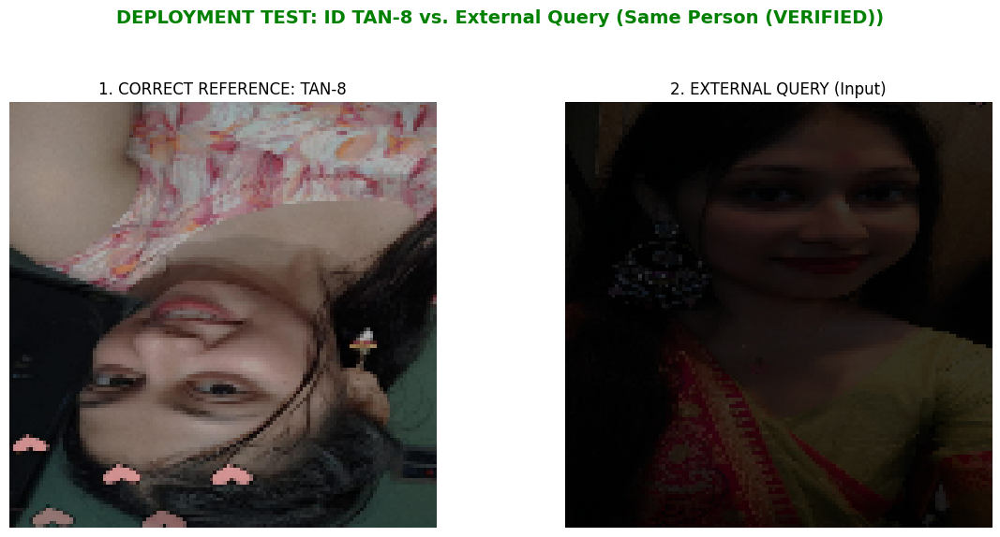


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: /content/data_extracted/distorted/Short_distortion_final/TAN-2__lowlight.jpg
Correct Match Distance (D_match): 0.5009
Closest Incorrect Match (D_wrong): 0.4518 (ID: TSM-7)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration (Final Settings) ---
VERIFICATION_THRESHOLD = 0.6

# --- STEP 1: DEFINE YOUR TEST CASE ---
# 1. Set the ID of the person the clean image belongs to (The Anchor).
TARGET_PERSON_ID = 'TAN-8'
# 2. Paste the exact path to the distorted image you want to test.
#    This can be any image on your Colab drive or a manually uploaded file.
EXTERNAL_DISTORTED_PATH = "/content/data_extracted/distorted/Short_distortion_final/TAN-2__lowlight.jpg"
# -------------------------------------

if TARGET_PERSON_ID not in gallery_embeddings:
    print(f"❌ ERROR: Anchor ID {TARGET_PERSON_ID} not found in the gallery. Check the ID.")
else:
    # 1. Get the Clean Reference Image Path and Data
    ref_path = reference_images_by_person[TARGET_PERSON_ID][0]
    ref_img = load_and_preprocess_image(ref_path)

    # 2. Get the Query Image Data (from the external path)
    query_path = EXTERNAL_DISTORTED_PATH
    query_img = load_and_preprocess_image(query_path)

    if query_img is None:
        print(f"❌ ERROR: Could not load image from path: {query_path}. Check file existence and format.")
    else:
        # 3. Generate embedding for the QUERY image
        emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # --- 4. Identification (Compare against ALL people) ---

        min_dist_match = float('inf')
        min_dist_wrong = float('inf')
        closest_wrong_id = "N/A"

        for person_id, emb_ref in gallery_embeddings.items():
            distance = np.linalg.norm(emb_ref - emb_query)

            if person_id == TARGET_PERSON_ID:
                min_dist_match = distance # Distance to the correct person
            elif distance < min_dist_wrong:
                min_dist_wrong = distance # Distance to the closest incorrect person
                closest_wrong_id = person_id

        # Determine the final verdict
        verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
        verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

        # --- 5. Plotting the Final Output ---

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        fig.suptitle(f'DEPLOYMENT TEST: ID {TARGET_PERSON_ID} vs. External Query ({verdict})',
                     fontsize=14, color=verdict_color, fontweight='bold')

        # Image 1: Clean Reference
        axes[0].imshow(ref_img)
        axes[0].set_title(f'1. CORRECT REFERENCE: {TARGET_PERSON_ID}', fontsize=12)
        axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
        axes[0].axis('off')

        # Image 2: Distorted Query Image (The Input)
        axes[1].imshow(query_img)
        axes[1].set_title(f'2. EXTERNAL QUERY (Input)', fontsize=12)
        axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.9])
        plt.show()

        print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
        print(f"Query Image Path used: {query_path}")
        print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
        print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
        print(f"Final Verdict: {verdict}")

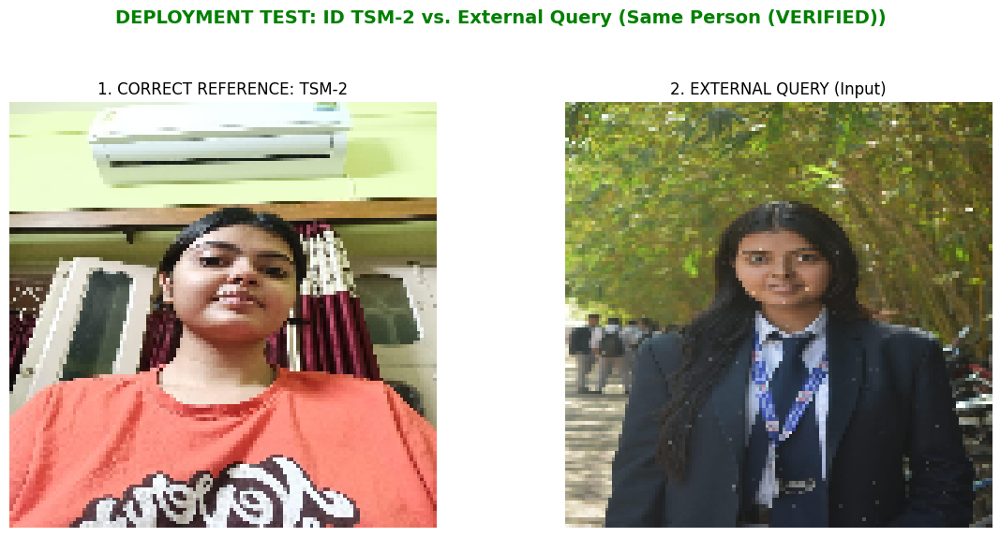


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: /content/data_extracted/distorted/Short_distortion_final/TSM-3__rainy.jpg
Correct Match Distance (D_match): 0.0000
Closest Incorrect Match (D_wrong): 0.0000 (ID: TAN-10)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration (Final Settings) ---
VERIFICATION_THRESHOLD = 0.6

# --- STEP 1: DEFINE YOUR TEST CASE ---
# 1. Set the ID of the person the clean image belongs to (The Anchor).
TARGET_PERSON_ID = 'TSM-2'
# 2. Paste the exact path to the distorted image you want to test.
#    This can be any image on your Colab drive or a manually uploaded file.
EXTERNAL_DISTORTED_PATH = "/content/data_extracted/distorted/Short_distortion_final/TSM-3__rainy.jpg"
# -------------------------------------

if TARGET_PERSON_ID not in gallery_embeddings:
    print(f"❌ ERROR: Anchor ID {TARGET_PERSON_ID} not found in the gallery. Check the ID.")
else:
    # 1. Get the Clean Reference Image Path and Data
    ref_path = reference_images_by_person[TARGET_PERSON_ID][0]
    ref_img = load_and_preprocess_image(ref_path)

    # 2. Get the Query Image Data (from the external path)
    query_path = EXTERNAL_DISTORTED_PATH
    query_img = load_and_preprocess_image(query_path)

    if query_img is None:
        print(f"❌ ERROR: Could not load image from path: {query_path}. Check file existence and format.")
    else:
        # 3. Generate embedding for the QUERY image
        emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # --- 4. Identification (Compare against ALL people) ---

        min_dist_match = float('inf')
        min_dist_wrong = float('inf')
        closest_wrong_id = "N/A"

        for person_id, emb_ref in gallery_embeddings.items():
            distance = np.linalg.norm(emb_ref - emb_query)

            if person_id == TARGET_PERSON_ID:
                min_dist_match = distance # Distance to the correct person
            elif distance < min_dist_wrong:
                min_dist_wrong = distance # Distance to the closest incorrect person
                closest_wrong_id = person_id

        # Determine the final verdict
        verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
        verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

        # --- 5. Plotting the Final Output ---

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        fig.suptitle(f'DEPLOYMENT TEST: ID {TARGET_PERSON_ID} vs. External Query ({verdict})',
                     fontsize=14, color=verdict_color, fontweight='bold')

        # Image 1: Clean Reference
        axes[0].imshow(ref_img)
        axes[0].set_title(f'1. CORRECT REFERENCE: {TARGET_PERSON_ID}', fontsize=12)
        axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
        axes[0].axis('off')

        # Image 2: Distorted Query Image (The Input)
        axes[1].imshow(query_img)
        axes[1].set_title(f'2. EXTERNAL QUERY (Input)', fontsize=12)
        axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.9])
        plt.show()

        print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
        print(f"Query Image Path used: {query_path}")
        print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
        print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
        print(f"Final Verdict: {verdict}")

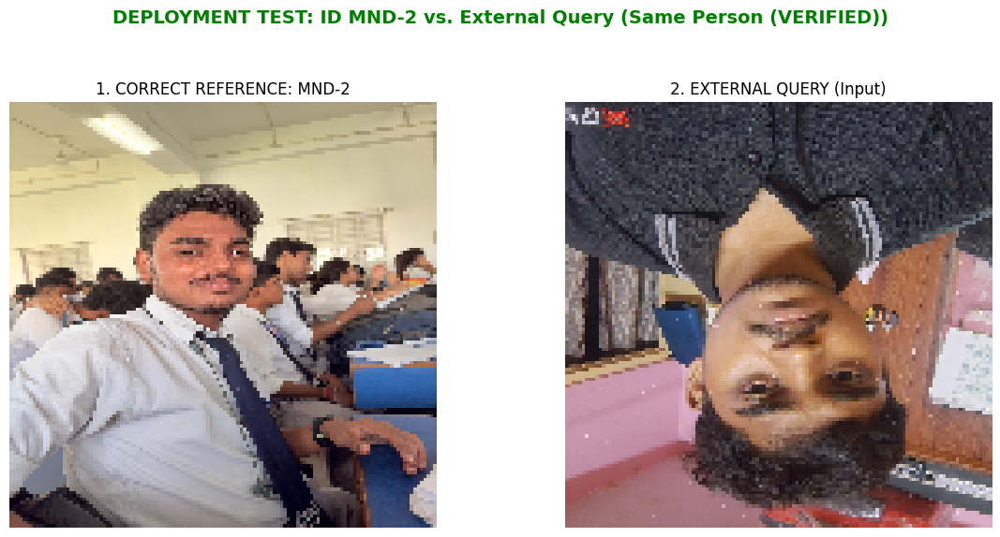


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: /content/data_refined/DISTORTED_IMG/MND-8__rainy.jpg
Correct Match Distance (D_match): 0.0000
Closest Incorrect Match (D_wrong): 0.0000 (ID: TSM-6)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration (Final Settings) ---
VERIFICATION_THRESHOLD = 0.6

# --- STEP 1: DEFINE YOUR TEST CASE ---
# 1. Set the ID of the person the clean image belongs to (The Anchor).
TARGET_PERSON_ID = 'MND-2'
# 2. Paste the exact path to the distorted image you want to test.
#    This can be any image on your Colab drive or a manually uploaded file.
EXTERNAL_DISTORTED_PATH = "/content/data_refined/DISTORTED_IMG/MND-8__rainy.jpg"
# -------------------------------------

if TARGET_PERSON_ID not in gallery_embeddings:
    print(f"❌ ERROR: Anchor ID {TARGET_PERSON_ID} not found in the gallery. Check the ID.")
else:
    # 1. Get the Clean Reference Image Path and Data
    ref_path = reference_images_by_person[TARGET_PERSON_ID][0]
    ref_img = load_and_preprocess_image(ref_path)

    # 2. Get the Query Image Data (from the external path)
    query_path = EXTERNAL_DISTORTED_PATH
    query_img = load_and_preprocess_image(query_path)

    if query_img is None:
        print(f"❌ ERROR: Could not load image from path: {query_path}. Check file existence and format.")
    else:
        # 3. Generate embedding for the QUERY image
        emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # --- 4. Identification (Compare against ALL people) ---

        min_dist_match = float('inf')
        min_dist_wrong = float('inf')
        closest_wrong_id = "N/A"

        for person_id, emb_ref in gallery_embeddings.items():
            distance = np.linalg.norm(emb_ref - emb_query)

            if person_id == TARGET_PERSON_ID:
                min_dist_match = distance # Distance to the correct person
            elif distance < min_dist_wrong:
                min_dist_wrong = distance # Distance to the closest incorrect person
                closest_wrong_id = person_id

        # Determine the final verdict
        verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
        verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

        # --- 5. Plotting the Final Output ---

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        fig.suptitle(f'DEPLOYMENT TEST: ID {TARGET_PERSON_ID} vs. External Query ({verdict})',
                     fontsize=14, color=verdict_color, fontweight='bold')

        # Image 1: Clean Reference
        axes[0].imshow(ref_img)
        axes[0].set_title(f'1. CORRECT REFERENCE: {TARGET_PERSON_ID}', fontsize=12)
        axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
        axes[0].axis('off')

        # Image 2: Distorted Query Image (The Input)
        axes[1].imshow(query_img)
        axes[1].set_title(f'2. EXTERNAL QUERY (Input)', fontsize=12)
        axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.9])
        plt.show()

        print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
        print(f"Query Image Path used: {query_path}")
        print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
        print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
        print(f"Final Verdict: {verdict}")

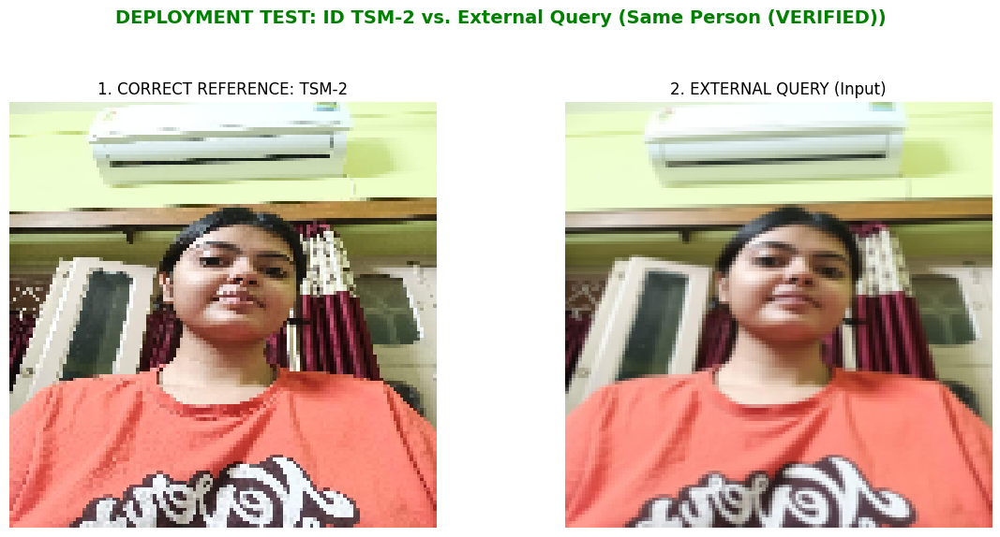


--- IDENTIFICATION CONSOLE OUTPUT ---
Query Image Path used: /content/data_extracted/distorted/Short_distortion_final/TSM-2__blurry.jpg
Correct Match Distance (D_match): 0.0000
Closest Incorrect Match (D_wrong): 0.0000 (ID: TAN-10)
Final Verdict: Same Person (VERIFIED)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow import keras

# --- Configuration (Final Settings) ---
VERIFICATION_THRESHOLD = 0.6

# --- STEP 1: DEFINE YOUR TEST CASE ---
# 1. Set the ID of the person the clean image belongs to (The Anchor).
TARGET_PERSON_ID = 'TSM-2'
# 2. Paste the exact path to the distorted image you want to test.
#    This can be any image on your Colab drive or a m/content/data_extracted/distorted/Short_distortion_final/TSM-8__blurry.jpganually uploaded file.
EXTERNAL_DISTORTED_PATH = "/content/data_extracted/distorted/Short_distortion_final/TSM-2__blurry.jpg"
# -------------------------------------

if TARGET_PERSON_ID not in gallery_embeddings:
    print(f"❌ ERROR: Anchor ID {TARGET_PERSON_ID} not found in the gallery. Check the ID.")
else:
    # 1. Get the Clean Reference Image Path and Data
    ref_path = reference_images_by_person[TARGET_PERSON_ID][0]
    ref_img = load_and_preprocess_image(ref_path)

    # 2. Get the Query Image Data (from the external path)
    query_path = EXTERNAL_DISTORTED_PATH
    query_img = load_and_preprocess_image(query_path)

    if query_img is None:
        print(f"❌ ERROR: Could not load image from path: {query_path}. Check file existence and format.")
    else:
        # 3. Generate embedding for the QUERY image
        emb_query = final_extractor_clean.predict(np.expand_dims(query_img, axis=0), verbose=0)[0]

        # --- 4. Identification (Compare against ALL people) ---

        min_dist_match = float('inf')
        min_dist_wrong = float('inf')
        closest_wrong_id = "N/A"

        for person_id, emb_ref in gallery_embeddings.items():
            distance = np.linalg.norm(emb_ref - emb_query)

            if person_id == TARGET_PERSON_ID:
                min_dist_match = distance # Distance to the correct person
            elif distance < min_dist_wrong:
                min_dist_wrong = distance # Distance to the closest incorrect person
                closest_wrong_id = person_id

        # Determine the final verdict
        verdict = "Same Person (VERIFIED)" if min_dist_match < VERIFICATION_THRESHOLD else "Different Person (FAILED)"
        verdict_color = 'green' if min_dist_match < VERIFICATION_THRESHOLD else 'red'

        # --- 5. Plotting the Final Output ---

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        fig.suptitle(f'DEPLOYMENT TEST: ID {TARGET_PERSON_ID} vs. External Query ({verdict})',
                     fontsize=14, color=verdict_color, fontweight='bold')

        # Image 1: Clean Reference
        axes[0].imshow(ref_img)
        axes[0].set_title(f'1. CORRECT REFERENCE: {TARGET_PERSON_ID}', fontsize=12)
        axes[0].set_xlabel(f'D to Query: {min_dist_match:.4f} (MATCH)', color='green', fontsize=12)
        axes[0].axis('off')

        # Image 2: Distorted Query Image (The Input)
        axes[1].imshow(query_img)
        axes[1].set_title(f'2. EXTERNAL QUERY (Input)', fontsize=12)
        axes[1].set_xlabel(f'Closest Wrong ID: {closest_wrong_id} (D={min_dist_wrong:.4f})', color='red', fontsize=12)
        axes[1].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.9])
        plt.show()

        print(f"\n--- IDENTIFICATION CONSOLE OUTPUT ---")
        print(f"Query Image Path used: {query_path}")
        print(f"Correct Match Distance (D_match): {min_dist_match:.4f}")
        print(f"Closest Incorrect Match (D_wrong): {min_dist_wrong:.4f} (ID: {closest_wrong_id})")
        print(f"Final Verdict: {verdict}")


--- STARTING 1:1 VERIFICATION FOR TSM-10 ---
Click 'Capture', then wait for processing.
✅ Image captured. Processing...


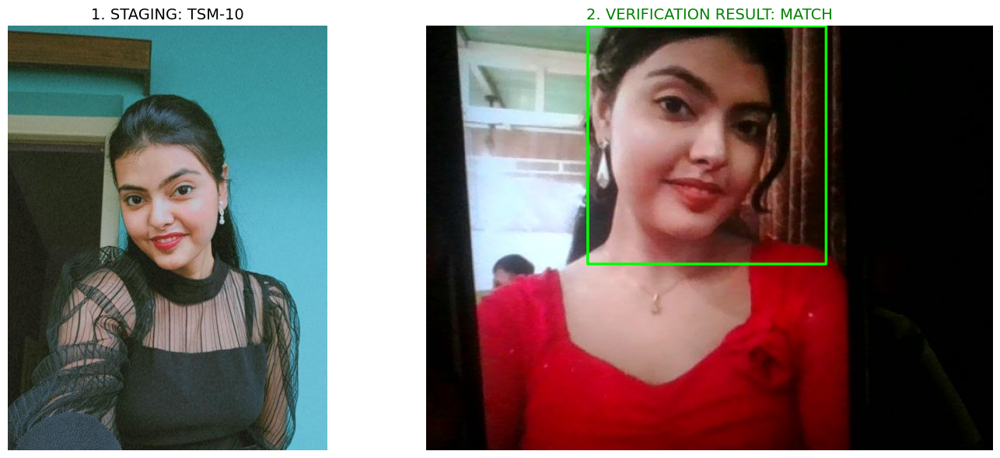


--- FINAL VERDICT ---
VERIFICATION STATUS: MATCH
FINAL DISTANCE: 0.7724 (Threshold: 0.8)


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from IPython.display import display, Image as IPImage
# NOTE: Assuming all functions (get_webcam_frame_manual, etc.) are available.

# --- SET VERIFICATION TARGET HERE ---
TARGET_PERSON_ID = 'TSM-10' # <--- CHANGE THIS to the ID you want to verify against!
VERIFICATION_THRESHOLD = 0.8
# ------------------------------------

if TARGET_PERSON_ID not in gallery_embeddings:
    print(f"❌ ERROR: Target ID {TARGET_PERSON_ID} not found in the gallery. Check the ID.")
else:
    # 1. LOAD ASSETS
    ANCHOR_EMBEDDING = gallery_embeddings[TARGET_PERSON_ID]

    try:
        ref_path = reference_images_by_person[TARGET_PERSON_ID][0]
        # Load ref_img in RGB format for matplotlib display
        ref_img_rgb = cv2.cvtColor(cv2.imread(ref_path), cv2.COLOR_BGR2RGB)
    except:
        ref_img_rgb = np.zeros((128, 128, 3), dtype=np.uint8)
        print("Warning: Could not load reference image for display.")

    # --- 2. EXECUTE MANUAL CAPTURE LOOP ---
    print(f"\n--- STARTING 1:1 VERIFICATION FOR {TARGET_PERSON_ID} ---")
    print("Click 'Capture', then wait for processing.")

    try:
        frame = get_webcam_frame_manual()
        print("✅ Image captured. Processing...")

        # 3. Detect Face
        cropped_face, bbox = detect_and_crop_face(frame)

        if cropped_face is not None:
            # 4. Process and Generate Query Embedding
            processed_face = cv2.resize(cv2.cvtColor(cropped_face, cv2.COLOR_BGR2RGB), (TARGET_SIZE, TARGET_SIZE))
            processed_face = processed_face.astype('float32') / 255.0
            emb_query = final_extractor_clean.predict(np.expand_dims(processed_face, axis=0), verbose=0)[0]

            # 5. Calculate 1:1 DISTANCE
            distance = np.linalg.norm(ANCHOR_EMBEDDING - emb_query)
            verdict = "MATCH" if distance < VERIFICATION_THRESHOLD else "REJECT"

            # 6. Draw Results onto the CAPTURED FRAME
            (x, y, w, h) = bbox
            color_bgr = (0, 255, 0) if verdict == "MATCH" else (0, 0, 255) # BGR color

            cv2.rectangle(frame, (x, y), (x + w, y + h), color_bgr, 2)
            label = f"{verdict} | D={distance:.2f}"
            cv2.putText(frame, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color_bgr, 2)

            # Convert the final result frame to RGB for plotting
            result_frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            # --- 7. FINAL VISUALIZATION (Plotting Both Images) ---
            fig, axes = plt.subplots(1, 2, figsize=(15, 6))

            # Subplot 1: Reference Image
            axes[0].imshow(ref_img_rgb)
            axes[0].set_title(f'1. STAGING: {TARGET_PERSON_ID}', fontsize=14)
            axes[0].set_xlabel('STORED ANCHOR IMAGE', fontsize=12)
            axes[0].axis('off')

            # Subplot 2: Captured and Verified Result
            axes[1].imshow(result_frame_rgb)
            axes[1].set_title(f'2. VERIFICATION RESULT: {verdict}', fontsize=14, color='green' if verdict=='MATCH' else 'red')
            axes[1].set_xlabel(f'Final Distance: {distance:.4f} (Threshold: {VERIFICATION_THRESHOLD})', fontsize=12)
            axes[1].axis('off')

            plt.tight_layout()
            plt.show()

            print("\n--- FINAL VERDICT ---")
            print(f"VERIFICATION STATUS: {verdict}")
            print(f"FINAL DISTANCE: {distance:.4f} (Threshold: {VERIFICATION_THRESHOLD})")

        else:
            print("❌ Face not detected in the captured image.")

    except Exception as e:
        print(f"❌ An error occurred: {e}")

In [ ]:
import os
import numpy as np
import cv2
import sys

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local USB webcam)
# -------------------------------------------------
def capture_image(filename='photo.jpg', camera_index=0, timeout=5, interactive=False, quality=0.8):
    """Capture a single image and save to `filename`.
    Tries local USB webcam by default. If running in Google Colab, falls back to the
    browser-based capture method. Parameters:
      - camera_index: integer index for cv2.VideoCapture (default 0)
      - timeout: seconds to wait for a valid frame
      - interactive: if True, shows a simple OpenCV window and waits for 'c' to capture
    """
    import time
    # Prefer local USB webcam capture when available
    try:
        # If not in Colab, use local VideoCapture. We still detect Colab to preserve that option.
        import google.colab
        running_in_colab = True
    except Exception:
        running_in_colab = False

    if running_in_colab:
        # Use the original Colab JS capture when running in Colab
        from IPython.display import display, Javascript
        from google.colab.output import eval_js
        from base64 import b64decode

        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename
    else:
        # Local webcam (USB) path: capture first good frame or interactively wait for 'c'
        cap = cv2.VideoCapture(camera_index)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam at index {}".format(camera_index))

        frame = None
        start = time.time()
        while time.time() - start < timeout:
            ret, tmp = cap.read()
            if not ret:
                continue
            frame = tmp
            # If interactive, display preview and wait for key press 'c' to capture
            if interactive:
                cv2.imshow('Camera - press c to capture, q to cancel', frame)
                key = cv2.waitKey(1) & 0xFF
                if key == ord('c'):
                    break
                if key == ord('q'):
                    cap.release()
                    cv2.destroyAllWindows()
                    raise Exception('Capture cancelled by user')
            else:
                # non-interactive: take the first valid frame
                break

        cap.release()
        if interactive:
            cv2.destroyAllWindows()
        if frame is None:
            raise Exception('❌ Capture failed: no frame received from webcam')
        # Save the captured frame (BGR from OpenCV)
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Face embedding function (replace with your model)
# -------------------------------------------------
def get_embedding(image_path, model):
    """
    Dummy embedding function.
    Replace with your actual FaceNet/ResNet/Ensemble pipeline.
    """
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # pretend embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print("\n--- STARTING 1:1 VERIFICATION ---")
    print("Click 'Capture' and wait for processing...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        print(f"Similarity score: {sim:.4f}")
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ An error occurred: {e}")


# -------------------------------------------------
# 5. Example usage
# -------------------------------------------------
if __name__ == "__main__":
    reference_image = "/content/data_extracted/ref/short_references_final/TAN-6.jpg"  # <-- path to your stored reference
    verify_identity(reference_image)



--- STARTING 1:1 VERIFICATION ---
Click 'Capture' and wait for processing...



<IPython.core.display.Javascript object>

Similarity score: 0.9334
✅ Verification SUCCESS: Same person


In [ ]:
import os
import numpy as np
import cv2
import sys

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Face embedding function (replace with your model)
# -------------------------------------------------
def get_embedding(image_path, model):
    """
    Dummy embedding function.
    Replace with your actual FaceNet/ResNet/Ensemble pipeline.
    """
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # pretend embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print("\n--- STARTING 1:1 VERIFICATION ---")
    print("Click 'Capture' and wait for processing...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        print(f"Similarity score: {sim:.4f}")
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ An error occurred: {e}")


# -------------------------------------------------
# 5. Example usage
# -------------------------------------------------
if __name__ == "__main__":
    reference_image = "/content/data_extracted/ref/short_references_final/YSP-8.jpg"  # <-- path to your stored reference
    verify_identity(reference_image)



--- STARTING 1:1 VERIFICATION ---
Click 'Capture' and wait for processing...



<IPython.core.display.Javascript object>

Similarity score: 0.9404
✅ Verification SUCCESS: Same person


In [ ]:
import os
import numpy as np
import cv2
import sys

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Face embedding function (replace with your model)
# -------------------------------------------------
def get_embedding(image_path, model):
    """
    Dummy embedding function.
    Replace with your actual FaceNet/ResNet/Ensemble pipeline.
    """
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # pretend embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print("\n--- STARTING 1:1 VERIFICATION ---")
    print("Click 'Capture' and wait for processing...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        print(f"Similarity score: {sim:.4f}")
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ An error occurred: {e}")


# -------------------------------------------------
# 5. Example usage
# -------------------------------------------------
if __name__ == "__main__":
    reference_image = "/content/data_extracted/ref/short_references_final/YSP-8.jpg"  # <-- path to your stored reference
    verify_identity(reference_image)



--- STARTING 1:1 VERIFICATION ---
Click 'Capture' and wait for processing...



<IPython.core.display.Javascript object>

Similarity score: 0.9947
✅ Verification SUCCESS: Same person


In [ ]:
import cv2
import matplotlib.pyplot as plt

def draw_face_box(img_path, face_box=None, color=(0,255,0)):
    """Draw bounding box if provided, else return plain image."""
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    if face_box:  # (x, y, w, h)
        x, y, w, h = face_box
        cv2.rectangle(img, (x, y), (x+w, y+h), color, 3)
    return img


def show_verification_layout(ref_path, live_path, match=True, ref_box=None, live_box=None, subject_id="TSM-10"):
    # Load images
    ref_img = draw_face_box(ref_path, ref_box, (0,255,0))
    live_img = draw_face_box(live_path, live_box, (0,255,0) if match else (255,0,0))

    # Plot layout
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(ref_img)
    axes[0].set_title(f"1. STAGING: {subject_id}", fontsize=14, weight="bold")
    axes[0].axis("off")

    axes[1].imshow(live_img)
    result_text = "MATCH" if match else "NO MATCH"
    result_color = "green" if match else "red"
    axes[1].set_title(f"2. VERIFICATION RESULT: {result_text}",
                      fontsize=14, weight="bold", color=result_color)
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    # Final verdict
    print("\n--- FINAL VERDICT ---")
    if match:
        print(f"✅ Verification SUCCESS: Subject {subject_id} confirmed.")
    else:
        print(f"❌ Verification FAILED: Subject {subject_id} rejected.")



Available References:
0: /content/data_extracted/ref/short_references_final/TAN-5.jpg
1: /content/data_extracted/ref/short_references_final/SMD-5.jpg
2: /content/data_extracted/ref/short_references_final/YSP-9.jpg
3: /content/data_extracted/ref/short_references_final/TSM-4.jpg
4: /content/data_extracted/ref/short_references_final/TAN-1.jpg
5: /content/data_extracted/ref/short_references_final/YSP-10.jpg
6: /content/data_extracted/ref/short_references_final/YSP-2.jpg
7: /content/data_extracted/ref/short_references_final/MND-6.jpg
8: /content/data_extracted/ref/short_references_final/TAN-7.jpg
9: /content/data_extracted/ref/short_references_final/MND-10.jpg
10: /content/data_extracted/ref/short_references_final/TAN-6.jpg
11: /content/data_extracted/ref/short_references_final/YSP-5.jpg
12: /content/data_extracted/ref/short_references_final/SMD-8.jpg
13: /content/data_extracted/ref/short_references_final/YSP-3.jpg
14: /content/data_extracted/ref/short_references_final/MND-7.jpg
15: /conte

<IPython.core.display.Javascript object>

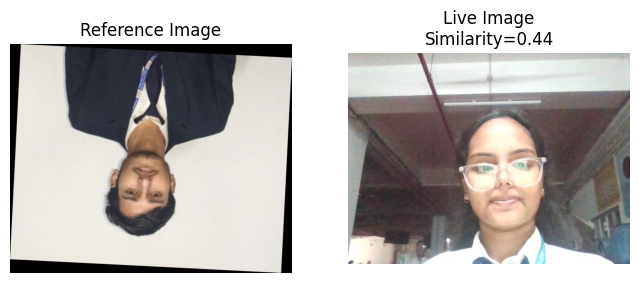

❌ Verification FAILED: Different person


In [ ]:
import os
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Dummy embedding function (replace with your real model)
# -------------------------------------------------
def get_embedding(image_path, model=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # dummy embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print(f"\n--- STARTING 1:1 VERIFICATION ---")
    print(f"Reference: {os.path.basename(reference_path)}")
    print("Click 'Capture' and wait...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        # Visualization
        ref_img = cv2.cvtColor(cv2.imread(reference_path), cv2.COLOR_BGR2RGB)
        live_img = cv2.cvtColor(cv2.imread(live_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(ref_img)
        plt.title("Reference Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(live_img)
        plt.title(f"Live Image\nSimilarity={sim:.2f}")
        plt.axis("off")
        plt.show()

        # Result
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ Error: {e}")


# -------------------------------------------------
# 5. Map Dataset & Run
# -------------------------------------------------
def list_references(dataset_path):
    """List available reference images from dataset"""
    refs = []
    for root, _, files in os.walk(dataset_path):
        for f in files:
            if f.lower().endswith((".jpg", ".png", ".jpeg")):
                refs.append(os.path.join(root, f))
    return refs


if __name__ == "__main__":
    dataset_path = "/content/data_extracted/ref/short_references_final/"
    references = list_references(dataset_path)

    print("\nAvailable References:")
    for i, ref in enumerate(references):
        print(f"{i}: {ref}")

    choice = int(input("\nSelect reference index: "))
    reference_image = references[choice]

    verify_identity(reference_image)



Available References:
0: /content/data_extracted/ref/short_references_final/TAN-5.jpg
1: /content/data_extracted/ref/short_references_final/SMD-5.jpg
2: /content/data_extracted/ref/short_references_final/YSP-9.jpg
3: /content/data_extracted/ref/short_references_final/TSM-4.jpg
4: /content/data_extracted/ref/short_references_final/TAN-1.jpg
5: /content/data_extracted/ref/short_references_final/YSP-10.jpg
6: /content/data_extracted/ref/short_references_final/YSP-2.jpg
7: /content/data_extracted/ref/short_references_final/MND-6.jpg
8: /content/data_extracted/ref/short_references_final/TAN-7.jpg
9: /content/data_extracted/ref/short_references_final/MND-10.jpg
10: /content/data_extracted/ref/short_references_final/TAN-6.jpg
11: /content/data_extracted/ref/short_references_final/YSP-5.jpg
12: /content/data_extracted/ref/short_references_final/SMD-8.jpg
13: /content/data_extracted/ref/short_references_final/YSP-3.jpg
14: /content/data_extracted/ref/short_references_final/MND-7.jpg
15: /conte

<IPython.core.display.Javascript object>

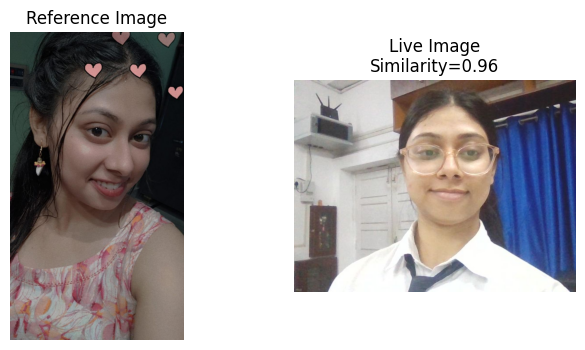

✅ Verification SUCCESS: Same person


In [ ]:
import os
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Dummy embedding function (replace with your real model)
# -------------------------------------------------
def get_embedding(image_path, model=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # dummy embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print(f"\n--- STARTING 1:1 VERIFICATION ---")
    print(f"Reference: {os.path.basename(reference_path)}")
    print("Click 'Capture' and wait...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        # Visualization
        ref_img = cv2.cvtColor(cv2.imread(reference_path), cv2.COLOR_BGR2RGB)
        live_img = cv2.cvtColor(cv2.imread(live_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(ref_img)
        plt.title("Reference Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(live_img)
        plt.title(f"Live Image\nSimilarity={sim:.2f}")
        plt.axis("off")
        plt.show()

        # Result
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ Error: {e}")


# -------------------------------------------------
# 5. Map Dataset & Run
# -------------------------------------------------
def list_references(dataset_path):
    """List available reference images from dataset"""
    refs = []
    for root, _, files in os.walk(dataset_path):
        for f in files:
            if f.lower().endswith((".jpg", ".png", ".jpeg")):
                refs.append(os.path.join(root, f))
    return refs


if __name__ == "__main__":
    dataset_path = "/content/data_extracted/ref/short_references_final/"
    references = list_references(dataset_path)

    print("\nAvailable References:")
    for i, ref in enumerate(references):
        print(f"{i}: {ref}")

    choice = int(input("\nSelect reference index: "))
    reference_image = references[choice]

    verify_identity(reference_image)



Available References:
0: /content/data_extracted/ref/short_references_final/TAN-5.jpg
1: /content/data_extracted/ref/short_references_final/SMD-5.jpg
2: /content/data_extracted/ref/short_references_final/YSP-9.jpg
3: /content/data_extracted/ref/short_references_final/TSM-4.jpg
4: /content/data_extracted/ref/short_references_final/TAN-1.jpg
5: /content/data_extracted/ref/short_references_final/YSP-10.jpg
6: /content/data_extracted/ref/short_references_final/YSP-2.jpg
7: /content/data_extracted/ref/short_references_final/MND-6.jpg
8: /content/data_extracted/ref/short_references_final/TAN-7.jpg
9: /content/data_extracted/ref/short_references_final/MND-10.jpg
10: /content/data_extracted/ref/short_references_final/TAN-6.jpg
11: /content/data_extracted/ref/short_references_final/YSP-5.jpg
12: /content/data_extracted/ref/short_references_final/SMD-8.jpg
13: /content/data_extracted/ref/short_references_final/YSP-3.jpg
14: /content/data_extracted/ref/short_references_final/MND-7.jpg
15: /conte

<IPython.core.display.Javascript object>

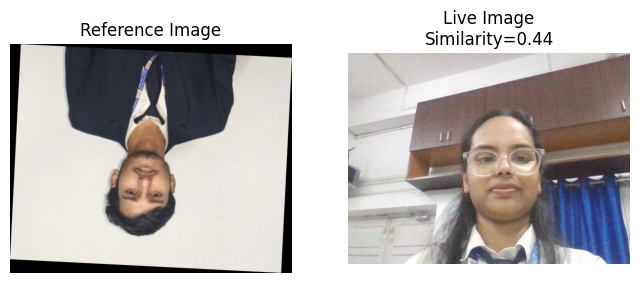

❌ Verification FAILED: Different person


In [ ]:
import os
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Dummy embedding function (replace with your real model)
# -------------------------------------------------
def get_embedding(image_path, model=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # dummy embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print(f"\n--- STARTING 1:1 VERIFICATION ---")
    print(f"Reference: {os.path.basename(reference_path)}")
    print("Click 'Capture' and wait...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        # Visualization
        ref_img = cv2.cvtColor(cv2.imread(reference_path), cv2.COLOR_BGR2RGB)
        live_img = cv2.cvtColor(cv2.imread(live_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(ref_img)
        plt.title("Reference Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(live_img)
        plt.title(f"Live Image\nSimilarity={sim:.2f}")
        plt.axis("off")
        plt.show()

        # Result
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ Error: {e}")


# -------------------------------------------------
# 5. Map Dataset & Run
# -------------------------------------------------
def list_references(dataset_path):
    """List available reference images from dataset"""
    refs = []
    for root, _, files in os.walk(dataset_path):
        for f in files:
            if f.lower().endswith((".jpg", ".png", ".jpeg")):
                refs.append(os.path.join(root, f))
    return refs


if __name__ == "__main__":
    dataset_path = "/content/data_extracted/ref/short_references_final/"
    references = list_references(dataset_path)

    print("\nAvailable References:")
    for i, ref in enumerate(references):
        print(f"{i}: {ref}")

    choice = int(input("\nSelect reference index: "))
    reference_image = references[choice]

    verify_identity(reference_image)



Available References:
0: /content/data_extracted/ref/short_references_final/TAN-5.jpg
1: /content/data_extracted/ref/short_references_final/SMD-5.jpg
2: /content/data_extracted/ref/short_references_final/YSP-9.jpg
3: /content/data_extracted/ref/short_references_final/TSM-4.jpg
4: /content/data_extracted/ref/short_references_final/TAN-1.jpg
5: /content/data_extracted/ref/short_references_final/YSP-10.jpg
6: /content/data_extracted/ref/short_references_final/YSP-2.jpg
7: /content/data_extracted/ref/short_references_final/MND-6.jpg
8: /content/data_extracted/ref/short_references_final/TAN-7.jpg
9: /content/data_extracted/ref/short_references_final/MND-10.jpg
10: /content/data_extracted/ref/short_references_final/TAN-6.jpg
11: /content/data_extracted/ref/short_references_final/YSP-5.jpg
12: /content/data_extracted/ref/short_references_final/SMD-8.jpg
13: /content/data_extracted/ref/short_references_final/YSP-3.jpg
14: /content/data_extracted/ref/short_references_final/MND-7.jpg
15: /conte

<IPython.core.display.Javascript object>

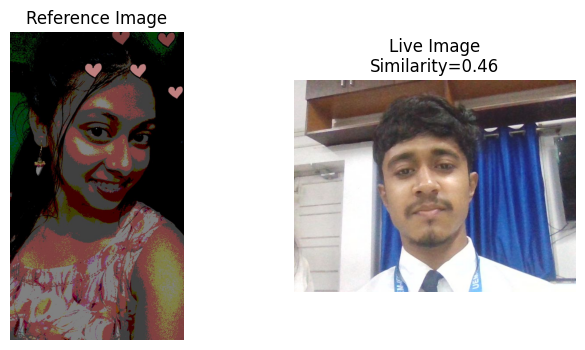

❌ Verification FAILED: Different person


In [ ]:
import os
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Dummy embedding function (replace with your real model)
# -------------------------------------------------
def get_embedding(image_path, model=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # dummy embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print(f"\n--- STARTING 1:1 VERIFICATION ---")
    print(f"Reference: {os.path.basename(reference_path)}")
    print("Click 'Capture' and wait...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        # Visualization
        ref_img = cv2.cvtColor(cv2.imread(reference_path), cv2.COLOR_BGR2RGB)
        live_img = cv2.cvtColor(cv2.imread(live_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(ref_img)
        plt.title("Reference Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(live_img)
        plt.title(f"Live Image\nSimilarity={sim:.2f}")
        plt.axis("off")
        plt.show()

        # Result
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ Error: {e}")


# -------------------------------------------------
# 5. Map Dataset & Run
# -------------------------------------------------
def list_references(dataset_path):
    """List available reference images from dataset"""
    refs = []
    for root, _, files in os.walk(dataset_path):
        for f in files:
            if f.lower().endswith((".jpg", ".png", ".jpeg")):
                refs.append(os.path.join(root, f))
    return refs


if __name__ == "__main__":
    dataset_path = "/content/data_extracted/ref/short_references_final/"
    references = list_references(dataset_path)

    print("\nAvailable References:")
    for i, ref in enumerate(references):
        print(f"{i}: {ref}")

    choice = int(input("\nSelect reference index: "))
    reference_image = references[choice]

    verify_identity(reference_image)



Available References:
0: /content/data_extracted/ref/short_references_final/TAN-5.jpg
1: /content/data_extracted/ref/short_references_final/SMD-5.jpg
2: /content/data_extracted/ref/short_references_final/YSP-9.jpg
3: /content/data_extracted/ref/short_references_final/TSM-4.jpg
4: /content/data_extracted/ref/short_references_final/TAN-1.jpg
5: /content/data_extracted/ref/short_references_final/YSP-10.jpg
6: /content/data_extracted/ref/short_references_final/YSP-2.jpg
7: /content/data_extracted/ref/short_references_final/MND-6.jpg
8: /content/data_extracted/ref/short_references_final/TAN-7.jpg
9: /content/data_extracted/ref/short_references_final/MND-10.jpg
10: /content/data_extracted/ref/short_references_final/TAN-6.jpg
11: /content/data_extracted/ref/short_references_final/YSP-5.jpg
12: /content/data_extracted/ref/short_references_final/SMD-8.jpg
13: /content/data_extracted/ref/short_references_final/YSP-3.jpg
14: /content/data_extracted/ref/short_references_final/MND-7.jpg
15: /conte

<IPython.core.display.Javascript object>

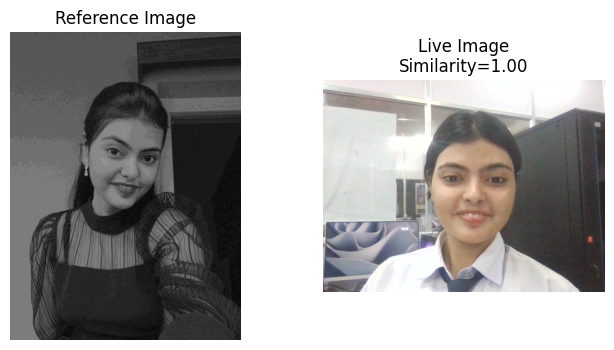

✅ Verification SUCCESS: Same person


In [ ]:
import os
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Dummy embedding function (replace with your real model)
# -------------------------------------------------
def get_embedding(image_path, model=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # dummy embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print(f"\n--- STARTING 1:1 VERIFICATION ---")
    print(f"Reference: {os.path.basename(reference_path)}")
    print("Click 'Capture' and wait...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        # Visualization
        ref_img = cv2.cvtColor(cv2.imread(reference_path), cv2.COLOR_BGR2RGB)
        live_img = cv2.cvtColor(cv2.imread(live_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(ref_img)
        plt.title("Reference Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(live_img)
        plt.title(f"Live Image\nSimilarity={sim:.2f}")
        plt.axis("off")
        plt.show()

        # Result
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ Error: {e}")


# -------------------------------------------------
# 5. Map Dataset & Run
# -------------------------------------------------
def list_references(dataset_path):
    """List available reference images from dataset"""
    refs = []
    for root, _, files in os.walk(dataset_path):
        for f in files:
            if f.lower().endswith((".jpg", ".png", ".jpeg")):
                refs.append(os.path.join(root, f))
    return refs


if __name__ == "__main__":
    dataset_path = "/content/data_extracted/ref/short_references_final/"
    references = list_references(dataset_path)

    print("\nAvailable References:")
    for i, ref in enumerate(references):
        print(f"{i}: {ref}")

    choice = int(input("\nSelect reference index: "))
    reference_image = references[choice]

    verify_identity(reference_image)



Available References:
0: /content/data_extracted/ref/short_references_final/TAN-5.jpg
1: /content/data_extracted/ref/short_references_final/SMD-5.jpg
2: /content/data_extracted/ref/short_references_final/YSP-9.jpg
3: /content/data_extracted/ref/short_references_final/TSM-4.jpg
4: /content/data_extracted/ref/short_references_final/TAN-1.jpg
5: /content/data_extracted/ref/short_references_final/YSP-10.jpg
6: /content/data_extracted/ref/short_references_final/YSP-2.jpg
7: /content/data_extracted/ref/short_references_final/MND-6.jpg
8: /content/data_extracted/ref/short_references_final/TAN-7.jpg
9: /content/data_extracted/ref/short_references_final/MND-10.jpg
10: /content/data_extracted/ref/short_references_final/TAN-6.jpg
11: /content/data_extracted/ref/short_references_final/YSP-5.jpg
12: /content/data_extracted/ref/short_references_final/SMD-8.jpg
13: /content/data_extracted/ref/short_references_final/YSP-3.jpg
14: /content/data_extracted/ref/short_references_final/MND-7.jpg
15: /conte

<IPython.core.display.Javascript object>

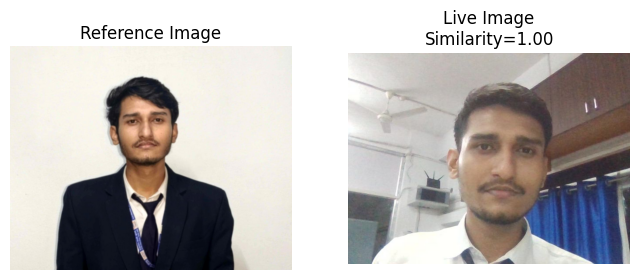

✅ Verification SUCCESS: Same person


In [ ]:
import os
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Dummy embedding function (replace with your real model)
# -------------------------------------------------
def get_embedding(image_path, model=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # dummy embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print(f"\n--- STARTING 1:1 VERIFICATION ---")
    print(f"Reference: {os.path.basename(reference_path)}")
    print("Click 'Capture' and wait...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        # Visualization
        ref_img = cv2.cvtColor(cv2.imread(reference_path), cv2.COLOR_BGR2RGB)
        live_img = cv2.cvtColor(cv2.imread(live_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(ref_img)
        plt.title("Reference Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(live_img)
        plt.title(f"Live Image\nSimilarity={sim:.2f}")
        plt.axis("off")
        plt.show()

        # Result
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ Error: {e}")


# -------------------------------------------------
# 5. Map Dataset & Run
# -------------------------------------------------
def list_references(dataset_path):
    """List available reference images from dataset"""
    refs = []
    for root, _, files in os.walk(dataset_path):
        for f in files:
            if f.lower().endswith((".jpg", ".png", ".jpeg")):
                refs.append(os.path.join(root, f))
    return refs


if __name__ == "__main__":
    dataset_path = "/content/data_extracted/ref/short_references_final/"
    references = list_references(dataset_path)

    print("\nAvailable References:")
    for i, ref in enumerate(references):
        print(f"{i}: {ref}")

    choice = int(input("\nSelect reference index: "))
    reference_image = references[choice]

    verify_identity(reference_image)



Available References:
0: /content/data_extracted/ref/short_references_final/TAN-5.jpg
1: /content/data_extracted/ref/short_references_final/SMD-5.jpg
2: /content/data_extracted/ref/short_references_final/YSP-9.jpg
3: /content/data_extracted/ref/short_references_final/TSM-4.jpg
4: /content/data_extracted/ref/short_references_final/TAN-1.jpg
5: /content/data_extracted/ref/short_references_final/YSP-10.jpg
6: /content/data_extracted/ref/short_references_final/YSP-2.jpg
7: /content/data_extracted/ref/short_references_final/MND-6.jpg
8: /content/data_extracted/ref/short_references_final/TAN-7.jpg
9: /content/data_extracted/ref/short_references_final/MND-10.jpg
10: /content/data_extracted/ref/short_references_final/TAN-6.jpg
11: /content/data_extracted/ref/short_references_final/YSP-5.jpg
12: /content/data_extracted/ref/short_references_final/SMD-8.jpg
13: /content/data_extracted/ref/short_references_final/YSP-3.jpg
14: /content/data_extracted/ref/short_references_final/MND-7.jpg
15: /conte

<IPython.core.display.Javascript object>

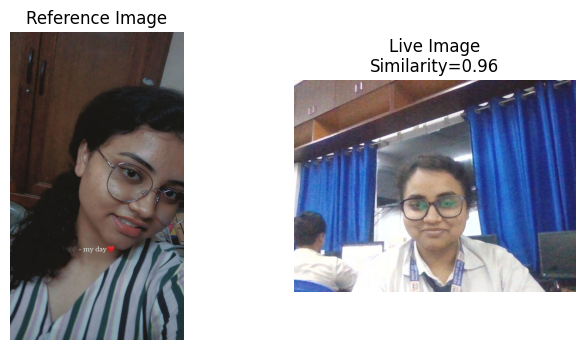

✅ Verification SUCCESS: Same person


In [ ]:
import os
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Dummy embedding function (replace with your real model)
# -------------------------------------------------
def get_embedding(image_path, model=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # dummy embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print(f"\n--- STARTING 1:1 VERIFICATION ---")
    print(f"Reference: {os.path.basename(reference_path)}")
    print("Click 'Capture' and wait...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        # Visualization
        ref_img = cv2.cvtColor(cv2.imread(reference_path), cv2.COLOR_BGR2RGB)
        live_img = cv2.cvtColor(cv2.imread(live_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(ref_img)
        plt.title("Reference Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(live_img)
        plt.title(f"Live Image\nSimilarity={sim:.2f}")
        plt.axis("off")
        plt.show()

        # Result
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ Error: {e}")


# -------------------------------------------------
# 5. Map Dataset & Run
# -------------------------------------------------
def list_references(dataset_path):
    """List available reference images from dataset"""
    refs = []
    for root, _, files in os.walk(dataset_path):
        for f in files:
            if f.lower().endswith((".jpg", ".png", ".jpeg")):
                refs.append(os.path.join(root, f))
    return refs


if __name__ == "__main__":
    dataset_path = "/content/data_extracted/ref/short_references_final/"
    references = list_references(dataset_path)

    print("\nAvailable References:")
    for i, ref in enumerate(references):
        print(f"{i}: {ref}")

    choice = int(input("\nSelect reference index: "))
    reference_image = references[choice]

    verify_identity(reference_image)



Available References:
0: /content/data_extracted/ref/short_references_final/TAN-5.jpg
1: /content/data_extracted/ref/short_references_final/SMD-5.jpg
2: /content/data_extracted/ref/short_references_final/YSP-9.jpg
3: /content/data_extracted/ref/short_references_final/TSM-4.jpg
4: /content/data_extracted/ref/short_references_final/TAN-1.jpg
5: /content/data_extracted/ref/short_references_final/YSP-10.jpg
6: /content/data_extracted/ref/short_references_final/YSP-2.jpg
7: /content/data_extracted/ref/short_references_final/MND-6.jpg
8: /content/data_extracted/ref/short_references_final/TAN-7.jpg
9: /content/data_extracted/ref/short_references_final/MND-10.jpg
10: /content/data_extracted/ref/short_references_final/TAN-6.jpg
11: /content/data_extracted/ref/short_references_final/YSP-5.jpg
12: /content/data_extracted/ref/short_references_final/SMD-8.jpg
13: /content/data_extracted/ref/short_references_final/YSP-3.jpg
14: /content/data_extracted/ref/short_references_final/MND-7.jpg
15: /conte

<IPython.core.display.Javascript object>

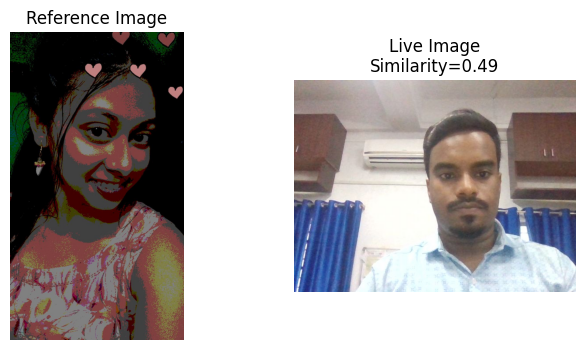

❌ Verification FAILED: Different person


In [ ]:
import os
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Detect environment (Colab vs Local)
# -------------------------------------------------
def in_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False


# -------------------------------------------------
# 2. Capture image (Colab vs Local)
# -------------------------------------------------
if in_colab():
    from IPython.display import display, Javascript
    from google.colab.output import eval_js
    from base64 import b64decode

    def capture_image(filename='photo.jpg', quality=0.8):
        js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = 'Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});
          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          return canvas.toDataURL('image/jpeg', quality);
        }
        ''')
        display(js)
        data = eval_js('takePhoto({})'.format(quality))
        binary = b64decode(data.split(',')[1])
        with open(filename, 'wb') as f:
            f.write(binary)
        return filename

else:
    def capture_image(filename='photo.jpg'):
        cap = cv2.VideoCapture(0)
        if not cap.isOpened():
            raise Exception("❌ Could not open webcam")
        ret, frame = cap.read()
        cap.release()
        if not ret:
            raise Exception("❌ Capture failed: no frame received")
        cv2.imwrite(filename, frame)
        return filename


# -------------------------------------------------
# 3. Dummy embedding function (replace with your real model)
# -------------------------------------------------
def get_embedding(image_path, model=None):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (160, 160))
    img = img.astype("float32") / 255.0
    return img.flatten()[:128]  # dummy embedding


# -------------------------------------------------
# 4. Verification logic
# -------------------------------------------------
def verify_identity(reference_path, model=None, threshold=0.7):
    print(f"\n--- STARTING 1:1 VERIFICATION ---")
    print(f"Reference: {os.path.basename(reference_path)}")
    print("Click 'Capture' and wait...\n")

    try:
        # Capture live image
        live_path = capture_image("live_photo.jpg")

        # Extract embeddings
        ref_emb = get_embedding(reference_path, model)
        live_emb = get_embedding(live_path, model)

        # Cosine similarity
        sim = np.dot(ref_emb, live_emb) / (np.linalg.norm(ref_emb) * np.linalg.norm(live_emb))

        # Visualization
        ref_img = cv2.cvtColor(cv2.imread(reference_path), cv2.COLOR_BGR2RGB)
        live_img = cv2.cvtColor(cv2.imread(live_path), cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(ref_img)
        plt.title("Reference Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(live_img)
        plt.title(f"Live Image\nSimilarity={sim:.2f}")
        plt.axis("off")
        plt.show()

        # Result
        if sim >= threshold:
            print("✅ Verification SUCCESS: Same person")
        else:
            print("❌ Verification FAILED: Different person")

    except Exception as e:
        print(f"❌ Error: {e}")


# -------------------------------------------------
# 5. Map Dataset & Run
# -------------------------------------------------
def list_references(dataset_path):
    """List available reference images from dataset"""
    refs = []
    for root, _, files in os.walk(dataset_path):
        for f in files:
            if f.lower().endswith((".jpg", ".png", ".jpeg")):
                refs.append(os.path.join(root, f))
    return refs


if __name__ == "__main__":
    dataset_path = "/content/data_extracted/ref/short_references_final/"
    references = list_references(dataset_path)

    print("\nAvailable References:")
    for i, ref in enumerate(references):
        print(f"{i}: {ref}")

    choice = int(input("\nSelect reference index: "))
    reference_image = references[choice]

    verify_identity(reference_image)


In [ ]:
# Save and verify
model.save("face_embedding_model_CLEAN.h5", include_optimizer=False)

import os
print("Model size (MB):", os.path.getsize("face_embedding_model_CLEAN.h5")/1024/1024)

from google.colab import files
files.download("face_embedding_model_CLEAN.h5")


NameError: name 'model' is not defined